In [1]:
%matplotlib inline

In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


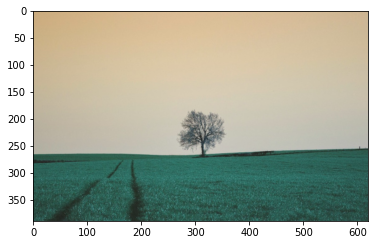

In [3]:
img = cv2.imread('./assets/imagens/paisagem01.jpg')
plt.imshow(img)
plt.show() #bgr é o formato usado pelo OPENCV

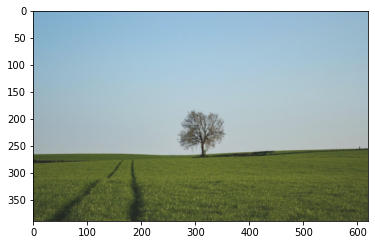

In [4]:
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(rgb);

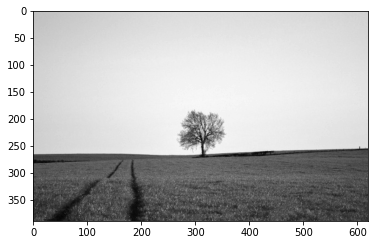

In [5]:
gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
plt.imshow(gray, cmap='gray');

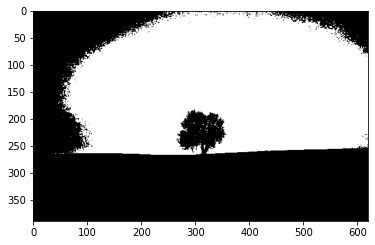

In [6]:
limiar = 180 #0 - 255

val, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)
plt.imshow(thresh, cmap='gray');

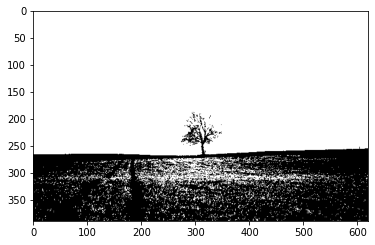

In [7]:
limiar = 100 #0 - 255

val, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)
plt.imshow(thresh, cmap='gray');

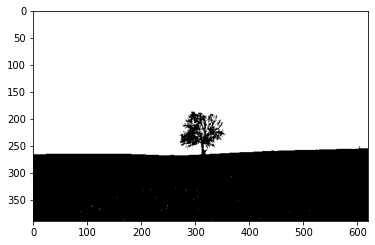

In [8]:
limiar = 140 #
val, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)
plt.imshow(thresh, cmap='gray');

In [133]:
def showImg(imagem):
    fig = plt.gcf()
    fig.set_size_inches(18,6)
    plt.imshow(cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB), cmap='gray')
    plt.axis('off')
    plt.show()

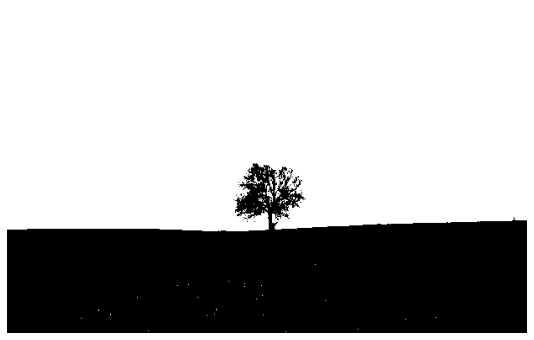

In [10]:
showImg(thresh)

In [11]:
cv2.imwrite('resultado_threshold.jpg', thresh)

True

    Tipos de Limiarização

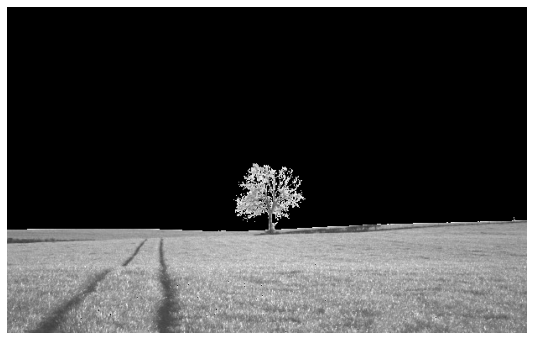

In [12]:
#_, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)
#_, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY_INV)
#_, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_TRUNC)
#_, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_TOZERO)
_, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_TOZERO_INV)
showImg(thresh)


In [13]:
def showLimiarization(img, limiar = 127):
    _, thresh_binary = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)
    _, thresh_binary_inv = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY_INV)
    _, thresh_trunc = cv2.threshold(gray, limiar, 255, cv2.THRESH_TRUNC)
    _, thresh_tozero = cv2.threshold(gray, limiar, 255, cv2.THRESH_TOZERO)
    _, thresh_tozero_inv = cv2.threshold(gray, limiar, 255, cv2.THRESH_TOZERO_INV)
    
    titulos = ['Original', 'Binary', 'Binary inv', 'Trunc', 'To zero', 'To zero inv']
    imagens = [img, thresh_binary, thresh_binary_inv, thresh_trunc, thresh_tozero, thresh_tozero_inv]
    
    fig = plt.gcf()
    fig.set_size_inches(18,12)
    for i in range(6):
        plt.subplot(2, 3, i+1 )
        plt.imshow(cv2.cvtColor(imagens[i], cv2.COLOR_BGR2RGB), cmap = 'gray')
        plt.title(titulos[i])
        plt.xticks([]),plt.yticks([])
    plt.show()

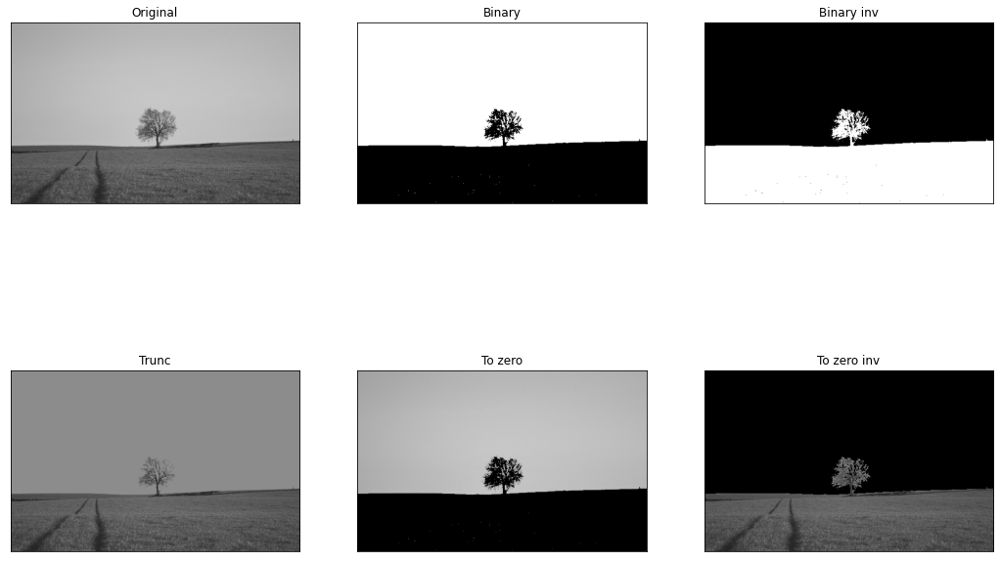

In [14]:
showLimiarization(gray, limiar)

    Exemplos com tomografia

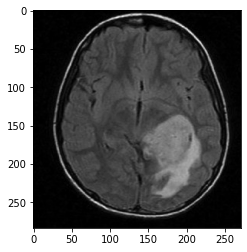

In [15]:
img = cv2.imread('./assets/imagens/ct-scan.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(gray, cmap = 'gray');

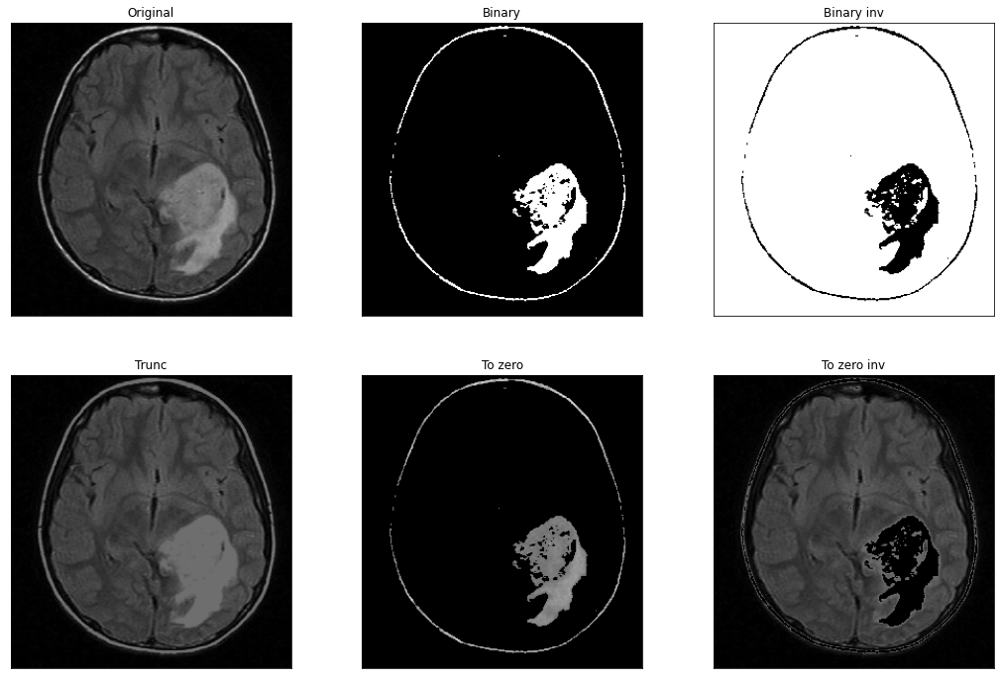

In [16]:
limiar = 110
showLimiarization(gray, limiar)

    Exercicio imagem infravermelho

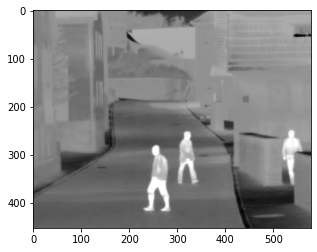

In [17]:
img = cv2.imread('./assets/imagens/thermal01.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(gray, cmap = 'gray');

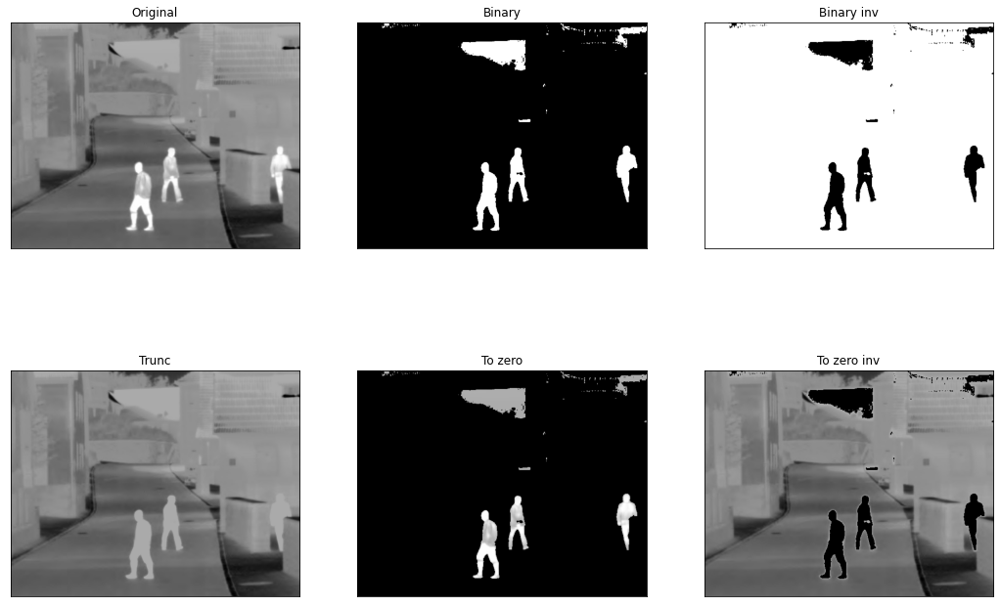

In [18]:
limiar = 170
showLimiarization(img, limiar)

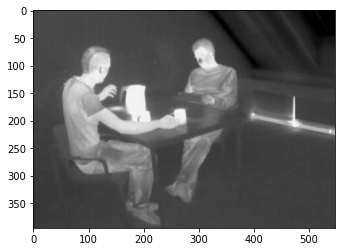

In [19]:
img = cv2.imread('./assets/imagens/thermal02.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(gray, cmap = 'gray');

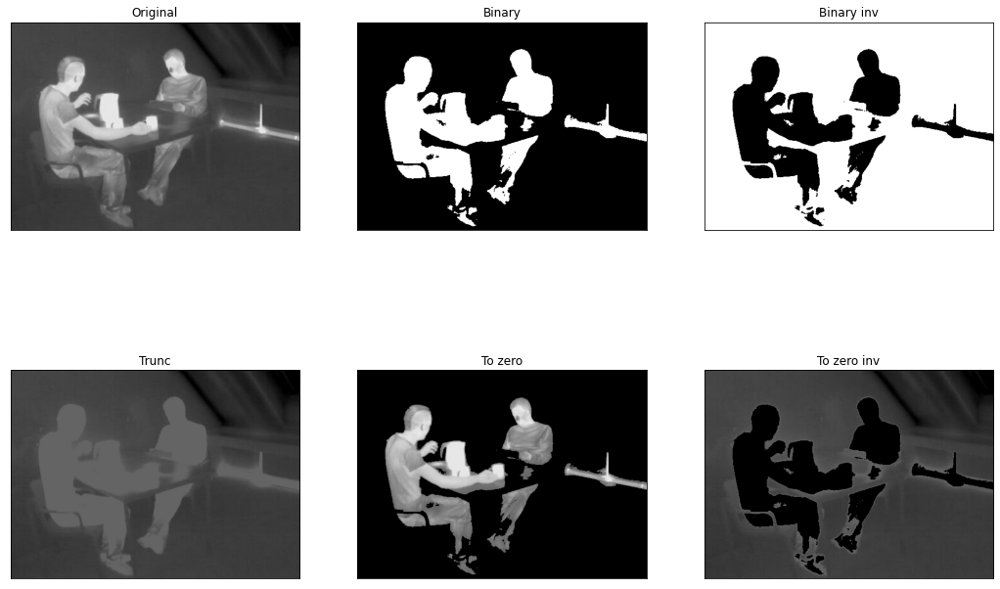

In [20]:
limiar = 100
showLimiarization(img, limiar)

    Separação de imagens

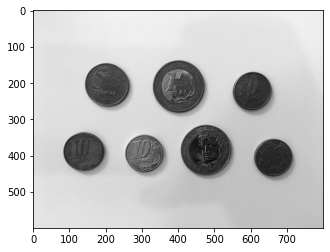

In [21]:
img = cv2.imread('./assets/imagens/moedas01.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(gray, cmap = 'gray');

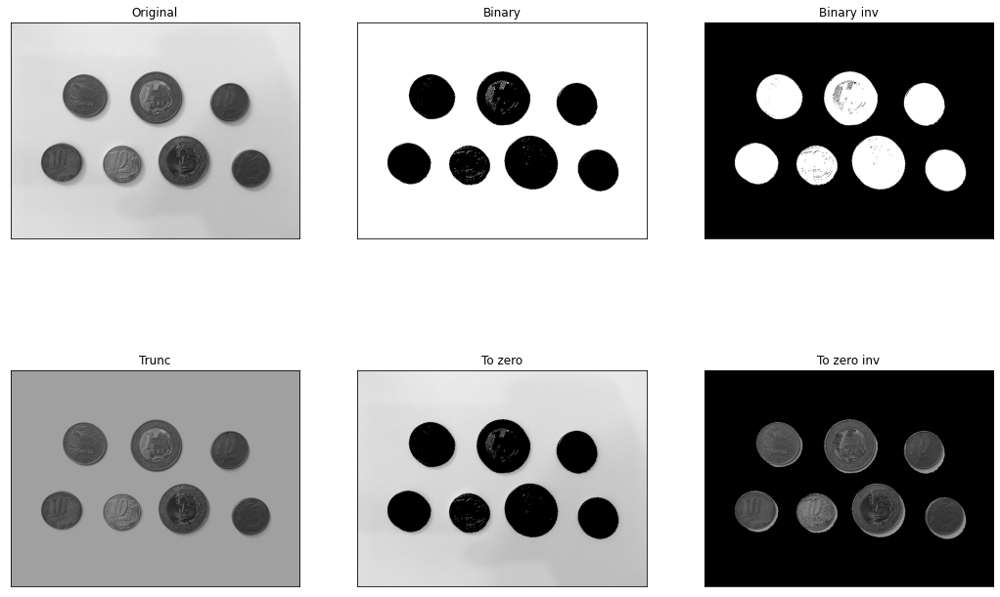

In [22]:
limiar = 160
showLimiarization(gray, limiar)

    Metodo de Otsu
    
    Faz a escolha do limiar automaticamente

In [23]:
img = cv2.imread('./assets/')

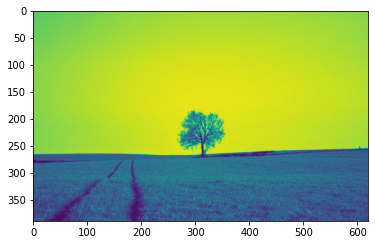

In [24]:
img = cv2.imread('./assets/imagens/paisagem01.jpg')
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
plt.imshow(gray)

In [25]:
valor, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
print(f'Valor de Limiar Otsu: {valor}')

Valor de Limiar Otsu: 136.0


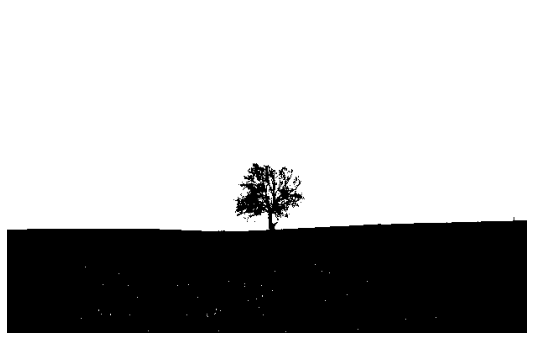

In [26]:
showImg(otsu)


    Histogramas

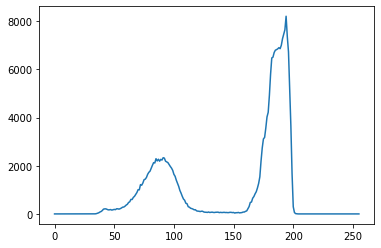

In [27]:
histograma, bins = np.histogram(gray, 256, [0, 256]);
plt.plot(histograma);

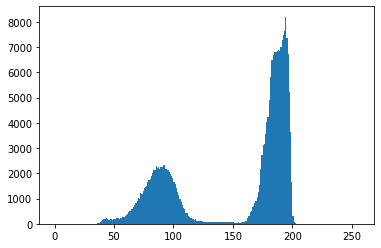

In [28]:

plt.hist(gray.ravel(), 256, [0, 256]);

    Imagens com ruido
   

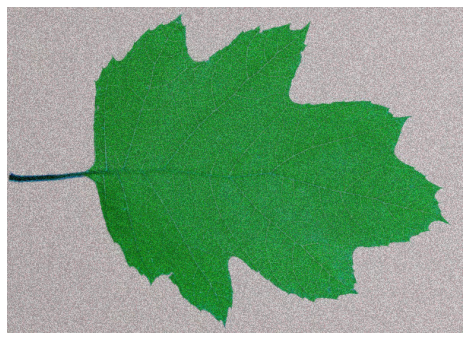

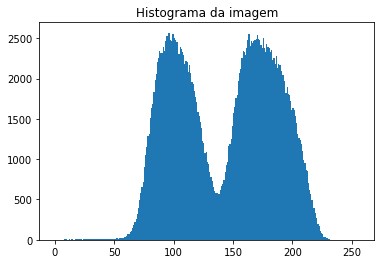

In [29]:
img = cv2.imread('./assets/imagens/folha_ruido.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
showImg(img)
plt.hist(gray.ravel(), 256, [0,256])

plt.title('Histograma da imagem')
plt.show()

Valor do limiar 139.0


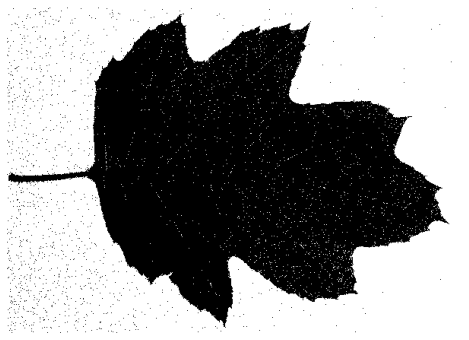

In [30]:
valor, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
print('Valor do limiar' , valor)
showImg(otsu)

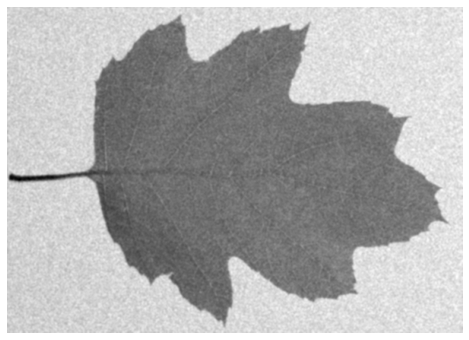

In [31]:
desfoque = cv2.GaussianBlur(gray, (5,5), 0)
showImg(desfoque)

Valor do limiar 139.0


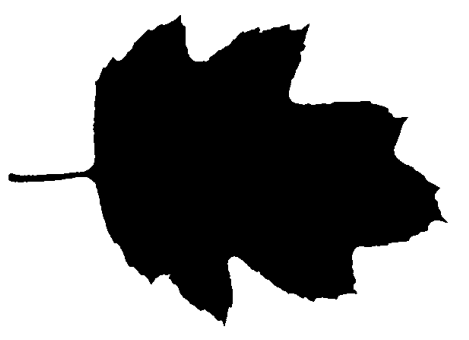

In [32]:
valor, otsu = cv2.threshold(desfoque, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
print('Valor do limiar' , valor)
showImg(otsu)

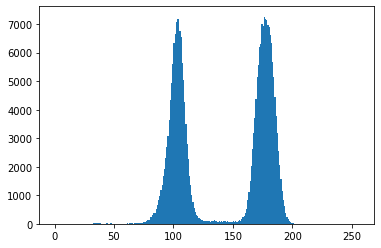

In [33]:
plt.hist(desfoque.ravel(), 256, [0,256]);

    Limiariazação Adaptativa

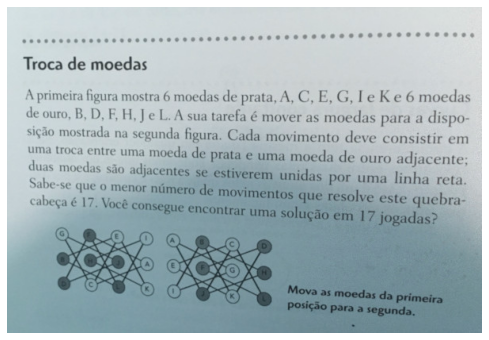

In [34]:
img = cv2.imread('./assets/imagens/livro-texto.jpg')
showImg(img)

175.0


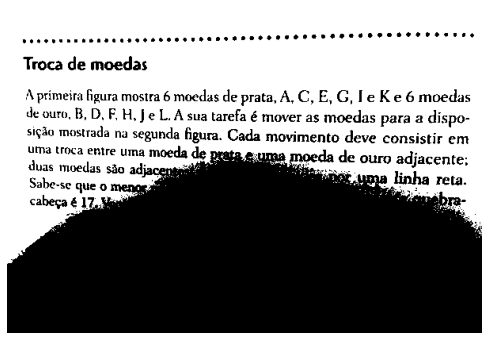

In [35]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
valor, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
print(valor)
showImg(otsu)

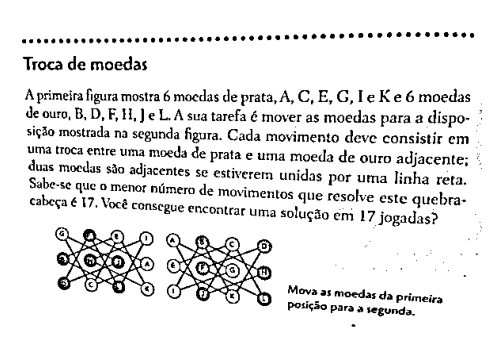

In [36]:
adapt_media = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 9)
showImg(adapt_media)

    Limiarização adaptativa Gaussiana
   

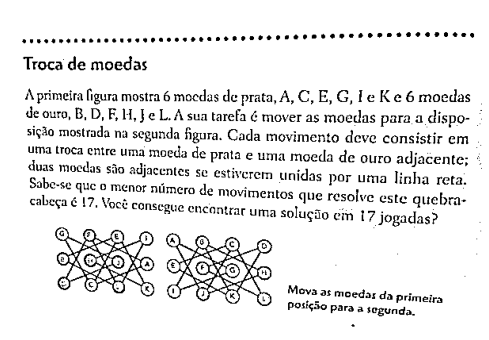

In [37]:
adapt_gauss = cv2.adaptiveThreshold(
    gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
showImg(adapt_gauss)

In [38]:
def limiarizacao_adaptativa(img, limiar=140, block_size = 11, C =9):
    _, limiar_global = cv2.threshold(img, limiar, 255, cv2.THRESH_BINARY)
    limiar_media = cv2.adaptiveThreshold(
    img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 
    block_size, C)
    
    limiar_gauss = cv2.adaptiveThreshold(
    img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 
    block_size, C)
    
    imagens = [img, limiar_global, limiar_media, limiar_gauss]
    titulos = [
        'Original', 
        'Limiarização Global', 
        'Limiarização adaptativa - Média',
        'Limiarização adaptativa - Gaussiana'
    ]
    
    fig = plt.gcf()
    fig.set_size_inches(18,12)
    
    for i in range(4):
        plt.subplot(2,2,i+1)
        plt.imshow(cv2.cvtColor(imagens[i], cv2.COLOR_BGR2RGB), cmap='gray')
        plt.title(titulos[i])
        plt.xticks([]),plt.yticks([])

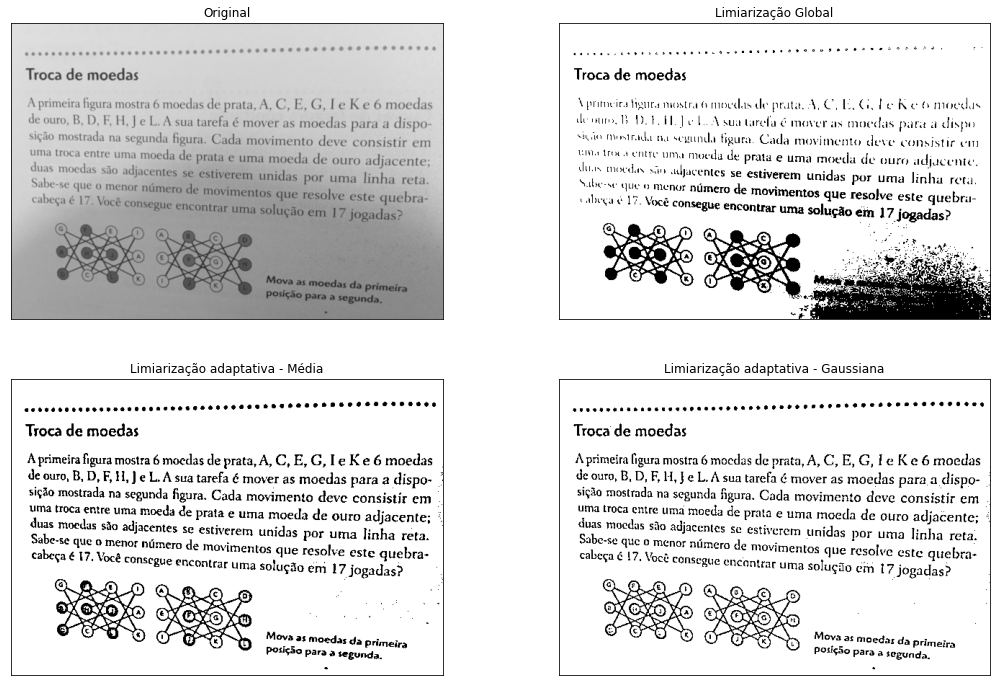

In [39]:
limiarizacao_adaptativa(gray)

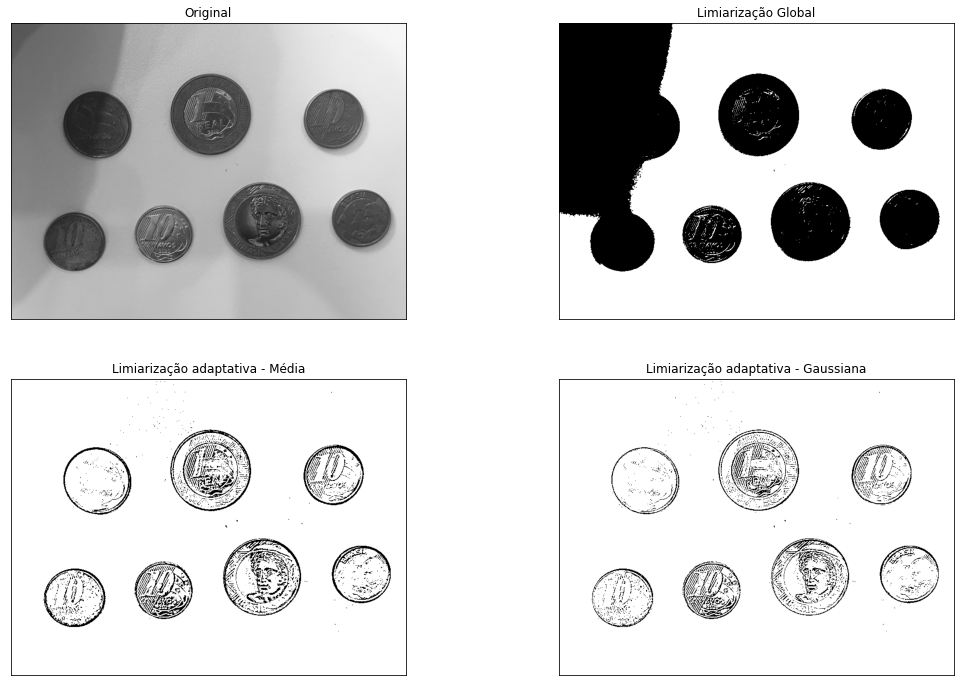

In [40]:
img = cv2.imread('./assets/imagens/moedas02.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
limiarizacao_adaptativa(gray, C=10)

    Segmentação com contornos
    
    Abertura -> primeiro fecha os pixel e depois abre para eliminar ruidos externos a imagem
    
    fechamento -> primeiro abre os pixel e depois fecha para eliminar ruidos internos a imagem

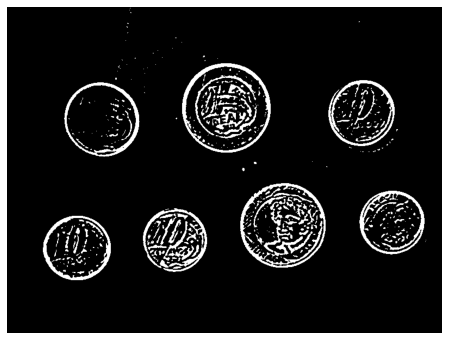

In [41]:
img_processada = img.copy()
desfoque = cv2.GaussianBlur(gray, (7,7), 0)
adapt_gauss = cv2.adaptiveThreshold(
    desfoque, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY_INV, 15, 3
)
showImg(adapt_gauss)

In [42]:
#abertura
kernel = np.ones((3,3), np.uint8)
kernel

array([[1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]], dtype=uint8)

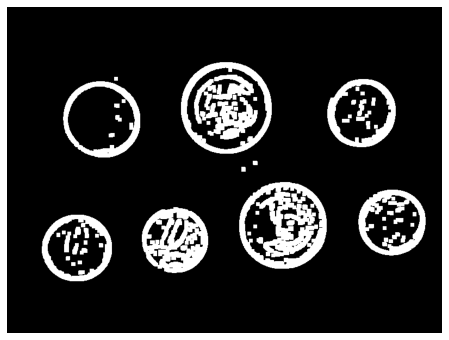

In [43]:
erosao = cv2.erode(adapt_gauss, kernel)
dilatacao = cv2.dilate(erosao, kernel, iterations=3) #iterations server para enfatizar as bordas
showImg(dilatacao)

In [44]:
elementos = dilatacao.copy()
contornos, hierarquia = cv2.findContours(
    elementos, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
)

In [45]:
print(contornos)

(array([[[117, 383]],

       [[116, 384]],

       [[112, 384]],

       [[111, 385]],

       [[109, 385]],

       [[108, 386]],

       [[106, 386]],

       [[105, 387]],

       [[103, 387]],

       [[102, 388]],

       [[101, 388]],

       [[100, 389]],

       [[ 99, 389]],

       [[ 98, 390]],

       [[ 97, 390]],

       [[ 96, 391]],

       [[ 95, 391]],

       [[ 93, 393]],

       [[ 92, 393]],

       [[ 91, 394]],

       [[ 90, 394]],

       [[ 86, 398]],

       [[ 85, 398]],

       [[ 85, 399]],

       [[ 83, 401]],

       [[ 82, 401]],

       [[ 82, 402]],

       [[ 78, 406]],

       [[ 78, 407]],

       [[ 75, 410]],

       [[ 75, 411]],

       [[ 73, 413]],

       [[ 73, 414]],

       [[ 71, 416]],

       [[ 71, 418]],

       [[ 70, 419]],

       [[ 70, 420]],

       [[ 69, 421]],

       [[ 69, 422]],

       [[ 68, 423]],

       [[ 68, 425]],

       [[ 67, 426]],

       [[ 67, 427]],

       [[ 66, 428]],

       [[ 66, 430]],

       [[

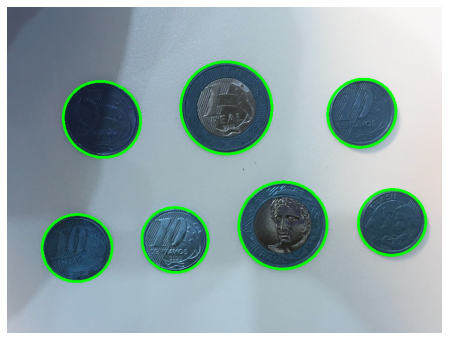

In [46]:
img_processada = img.copy()
for cnt in contornos:
    area = cv2.contourArea(cnt)
    if len(cnt) >= 100: #valor definido pelos contornos encontrados cnt
        elipse = cv2.fitEllipse(cnt)
        cv2.ellipse(img_processada, elipse, (0,255,0), 3)
showImg(img_processada)

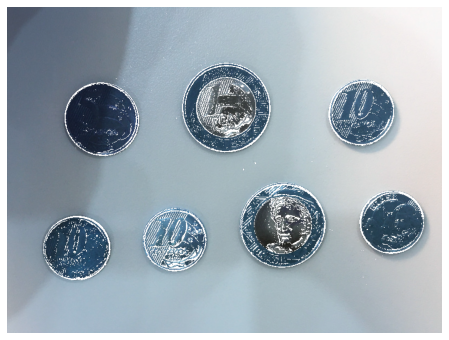

In [47]:
adapt_gauss = cv2.adaptiveThreshold(
    gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY_INV, 15, 11
)
sobrepor = cv2.add(img, cv2.cvtColor(adapt_gauss, cv2.COLOR_GRAY2BGR))
showImg(sobrepor)

    Segmentação baseada em bordas

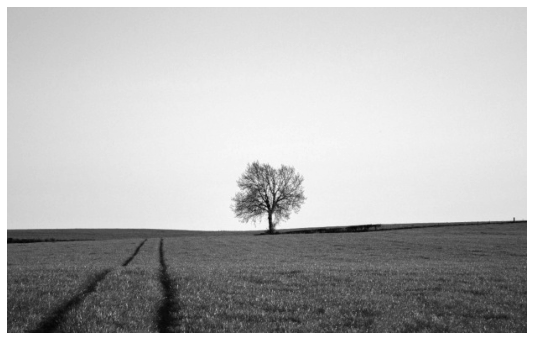

In [48]:
img = cv2.imread('./assets/imagens/paisagem01.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
showImg(gray)

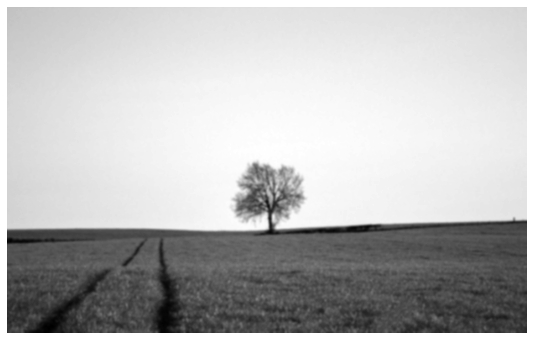

In [49]:
desfoque = cv2.GaussianBlur(gray, (5,5), 0)
showImg(desfoque)

    Operador Sobel

In [50]:
#Primeira forma
#definindo kernel e matriz
k_sobelX = np.array(([-1, 0, 1],
                     [-2, 0, 2],
                     [-1, 0, 1]), np.float32);

k_sobelY = np.array(([-1, -2, 1],
                     [0, 0, 0],
                     [1, 2, 1]), np.float32);
sobel_x = cv2.filter2D(desfoque, cv2.CV_64F, k_sobelX)
sobel_y = cv2.filter2D(desfoque, cv2.CV_64F, k_sobelY)

In [51]:
#Segunda forma
# terceiro e quarto parametro definem direção da derivada
# 1, 0 -> direçao x
# 0, 1 -> direçao y
sobel_x = cv2.Sobel(desfoque, cv2.CV_64F, 1, 0, ksize = 3) 
sobel_y = cv2.Sobel(desfoque, cv2.CV_64F, 0, 1, ksize = 3)

In [52]:
#Converte valores para abs
sobel_x = cv2.convertScaleAbs(sobel_x)
sobel_y = cv2.convertScaleAbs(sobel_y)

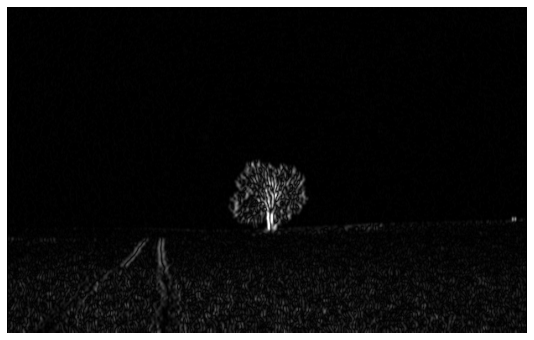

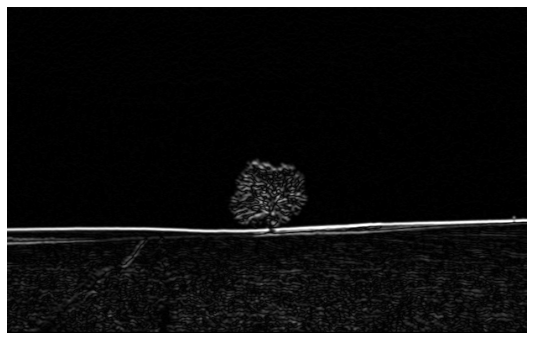

In [53]:
showImg(sobel_x)
showImg(sobel_y)

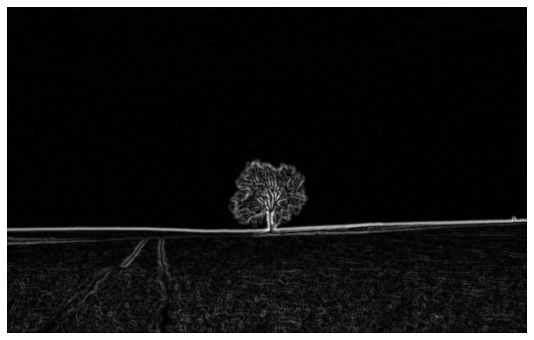

In [54]:
#Necessario concatenar para que o filtro em X e Y se juntem
sobel = cv2.addWeighted(src1 = sobel_x, alpha=0.5, src2=sobel_y, beta=0.5, gamma = 0)
showImg(sobel)

        Canny Edge
        

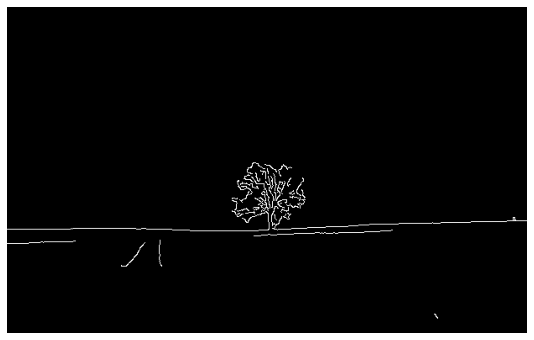

In [55]:
canny = cv2.Canny(desfoque, 80, 140) #Limiar baixo | limiar alto
showImg(canny)

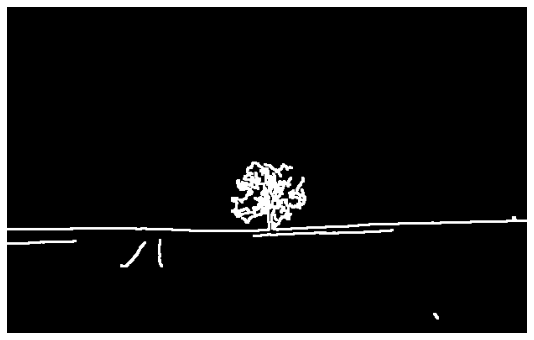

In [56]:
#Aplicando dilatação para aumentar bordas
dilatacao = cv2.dilate(canny, np.ones((3,3), np.uint8))
showImg(dilatacao)

In [57]:
def segmentacao_bordas(img): #img deve ser cinza
    desfoque = cv2.GaussianBlur(img, (5,5), 0)
    
    sobel_x = cv2.Sobel(desfoque, cv2.CV_64F, 1, 0, ksize = 3) 
    sobel_y = cv2.Sobel(desfoque, cv2.CV_64F, 0, 1, ksize = 3)
    sobel_x = cv2.convertScaleAbs(sobel_x)
    sobel_y = cv2.convertScaleAbs(sobel_y)
    sobel = cv2.addWeighted(src1 = sobel_x, alpha=0.5, src2=sobel_y, beta=0.5, gamma = 0)
    
    canny = cv2.Canny(desfoque, 80, 140) #Limiar baixo | limiar alto
    kernel = np.ones((3,3), np.uint8)
    dilatacao = cv2.dilate(canny, kernel, iterations=2) #iterations server para enfatizar as bordas
    erosao = cv2.erode(dilatacao, kernel, iterations=1)
    
    imagens = [img, sobel, canny, erosao]
    titulos = ['Original', 'Sobel', 'Canny Edge', 'Canny Edge + Fechamento']
    fig = plt.gcf()
    fig.set_size_inches(18,12)
    
    for i in range(4):
        plt.subplot(2,2,i+1)
        plt.imshow(cv2.cvtColor(imagens[i], cv2.COLOR_BGR2RGB), cmap='gray')
        plt.title(titulos[i])
        plt.xticks([]),plt.yticks([])

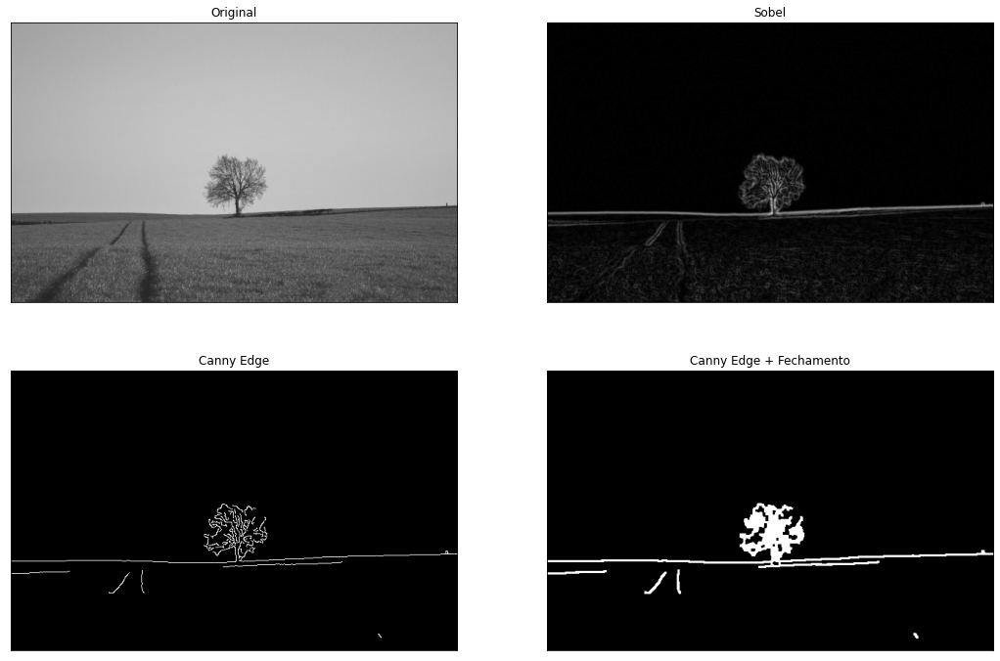

In [58]:
segmentacao_bordas(gray)

    Testes

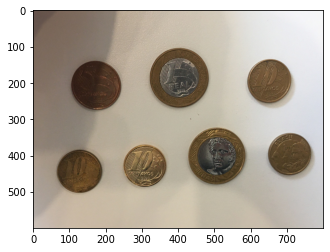

In [59]:
imagem = cv2.imread('./assets/imagens/moedas02.jpg')
rgb = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
plt.imshow(rgb);

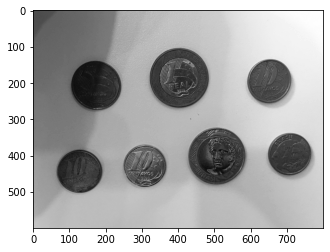

In [60]:
gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
plt.imshow(gray, cmap='gray');

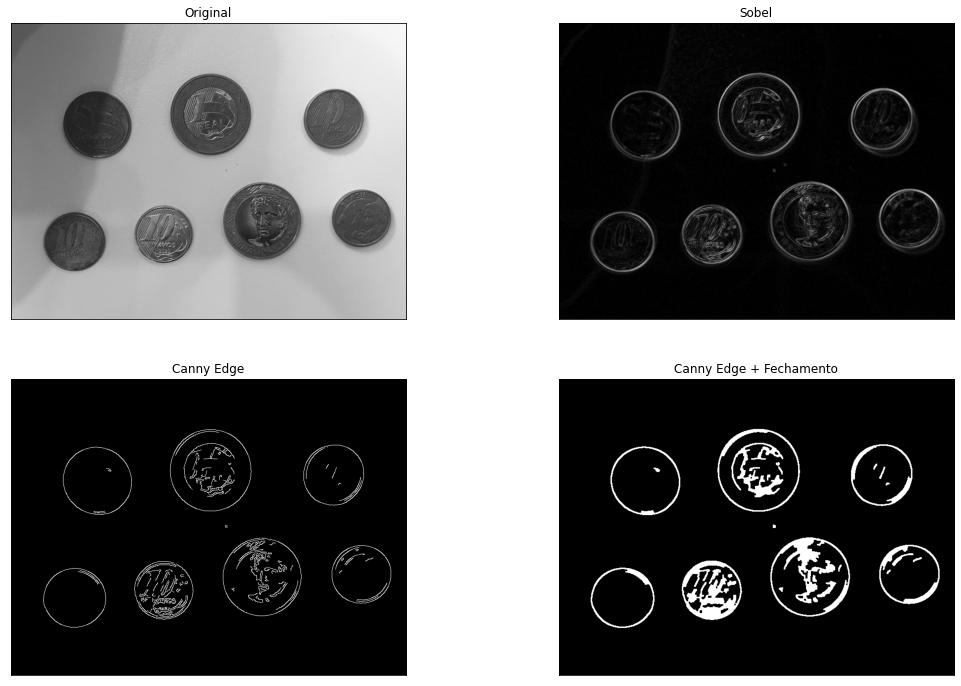

In [61]:
segmentacao_bordas(gray)

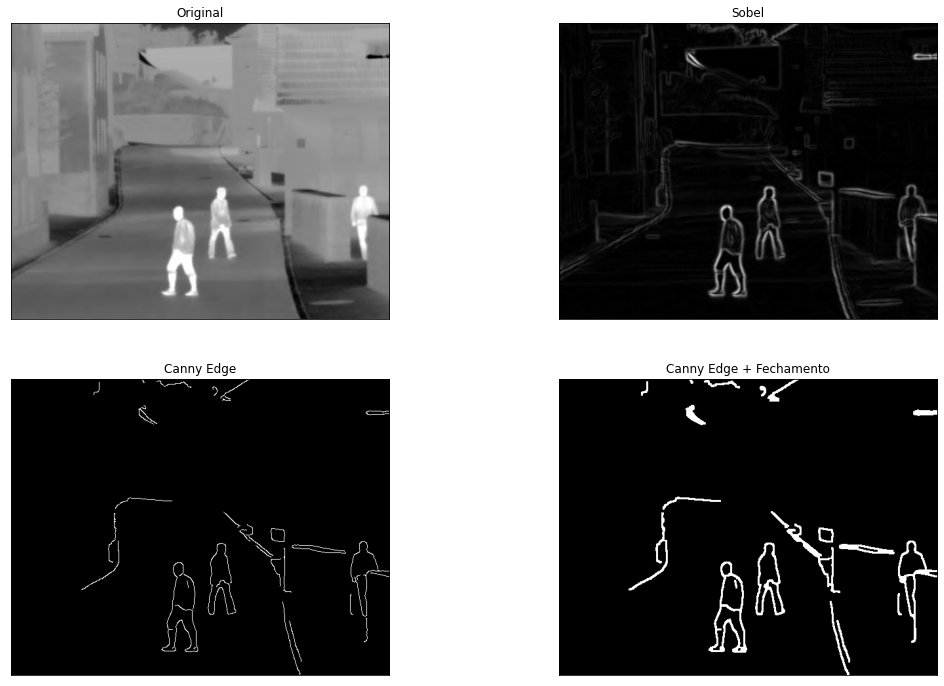

In [62]:
imagem = cv2.imread('./assets/imagens/thermal01.jpg')
gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)
segmentacao_bordas(gray)

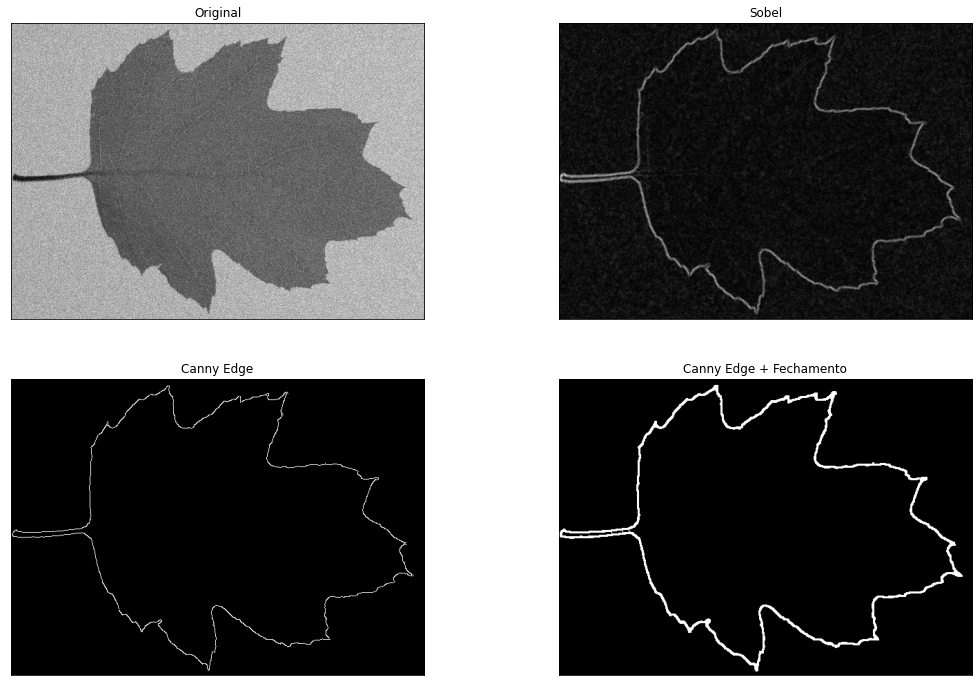

In [63]:
imagem = cv2.imread('./assets/imagens/folha_ruido.jpg')
gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)
segmentacao_bordas(gray)

    Preenchimento das detecçoes
   

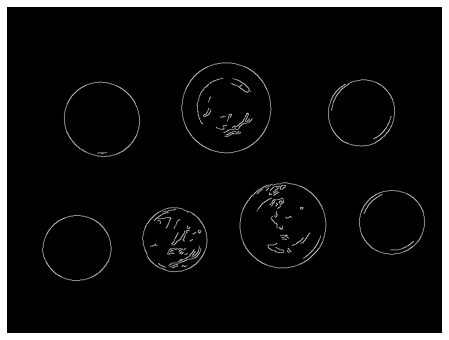

In [64]:
#Fechamento
img = cv2.imread('./assets/imagens/moedas02.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
desfoque = cv2.GaussianBlur(gray, (7, 7), 0)
canny = cv2.Canny(desfoque, 80, 140)
showImg(canny)

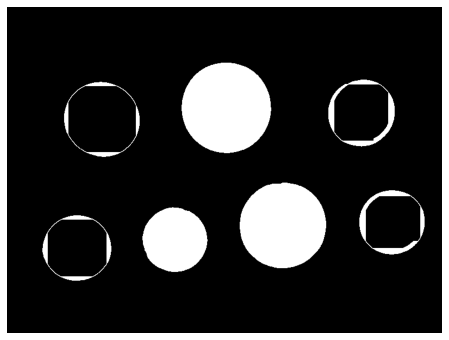

In [65]:
#Dilataçao + erosao
kernel = np.ones((5, 5), np.uint8)
dilatacao = cv2.dilate(canny, kernel, iterations=14)
erosao = cv2.erode(dilatacao, kernel, iterations=14)
showImg(erosao)

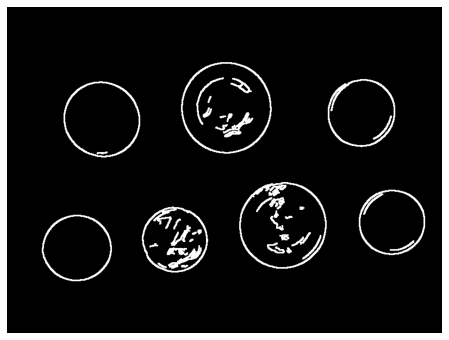

In [66]:
#Detecção dos contornos
dilatacao = cv2.dilate(canny, np.ones((3,3), np.uint8), iterations=1)
showImg(dilatacao)

In [67]:
contornos, hierarquia = cv2.findContours(dilatacao, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

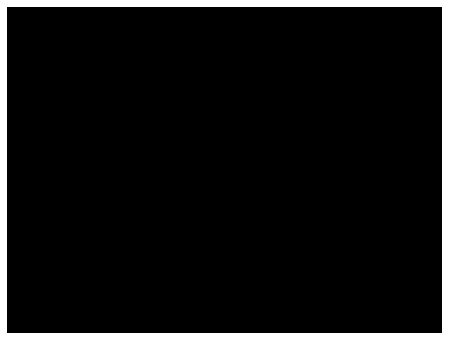

In [68]:
mascara = np.zeros((img.shape[0], img.shape[1]), dtype = np.uint8)
showImg(mascara)

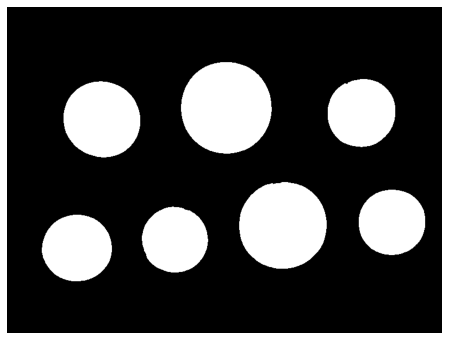

In [69]:
cv2.drawContours(mascara, contornos, -1, color=(255,255,255), thickness=cv2.FILLED)
showImg(mascara)

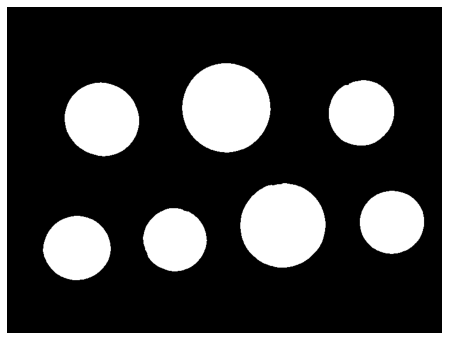

In [70]:
mascara = cv2.erode(mascara, np.ones((3,3), np.uint8), iterations=2)
showImg(mascara)

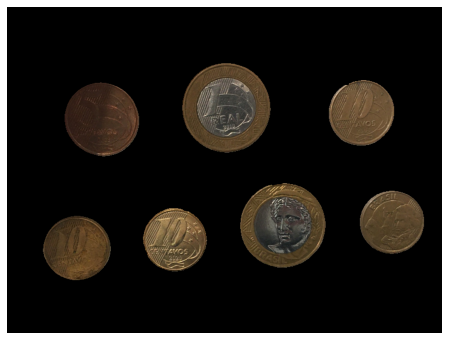

In [71]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_final = cv2.bitwise_and(img, img, mask=mascara)
showImg(img_final)

    Mascaramento

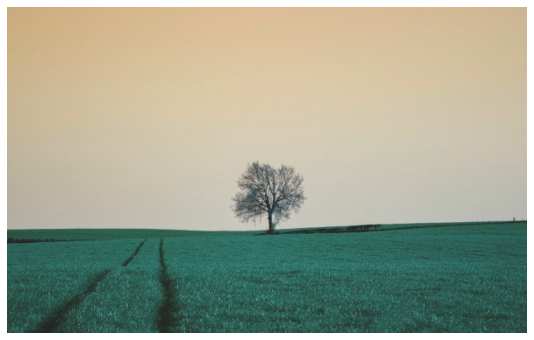

In [72]:
#Isolando objeto
img = cv2.imread('./assets/imagens/paisagem01.jpg')
showImg(img)

In [73]:
altura, largura = img.shape[:2]

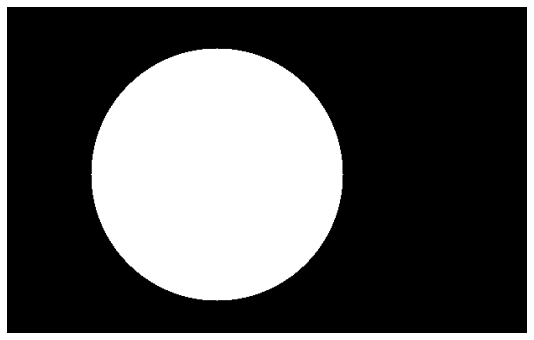

In [74]:
mascara = np.zeros((altura, largura), dtype='uint8')
cv2.circle(mascara, (250, 200), 150, 255, -1)
showImg(mascara)

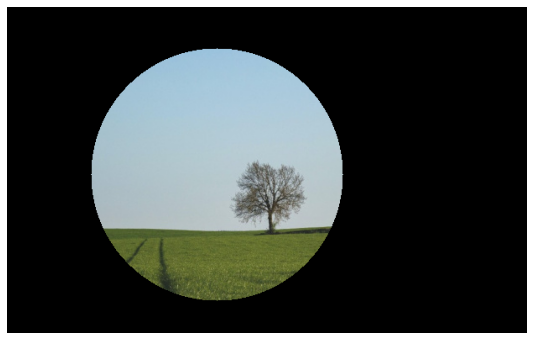

In [75]:
img_final = cv2.bitwise_and(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.cvtColor(img, cv2.COLOR_BGR2RGB), mask=mascara)
showImg(img_final)

In [76]:
fundo_branco = 255 * np.ones((altura, largura, 3), dtype='uint8')

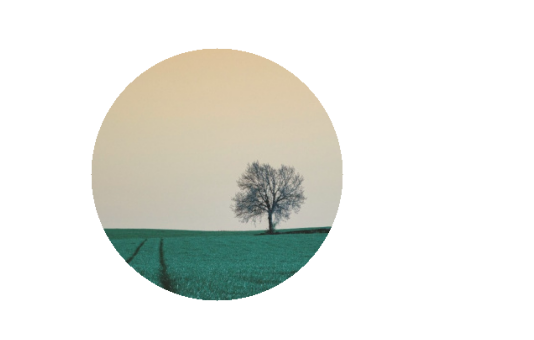

In [77]:
img_final = img.copy()
img_final[mascara == 0] = fundo_branco[mascara == 0]
showImg(img_final)

In [78]:
fundo = cv2.imread('./assets/imagens/montanha.jpg')
fundo.shape

(750, 1180, 3)

In [79]:
#Redimensionar fundo
fundo = cv2.resize(fundo, (largura, altura))
fundo.shape

(389, 620, 3)

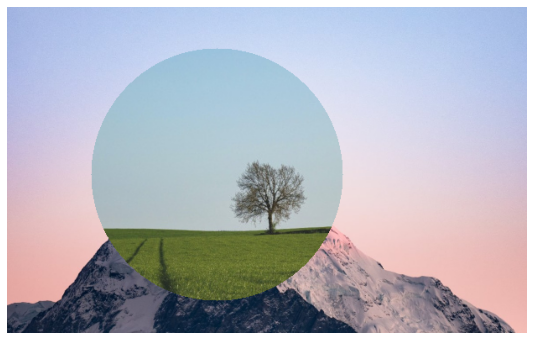

In [80]:
img_final[mascara == 0] = fundo[mascara == 0]
showImg(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))

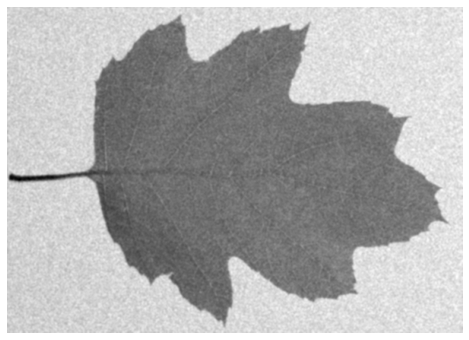

In [81]:
#Isolando objeto
img = cv2.imread('./assets/imagens/folha_ruido.jpg')
altura, largura = img.shape[:2]
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
desfoque = cv2.GaussianBlur(gray, (5, 5), 0)
showImg(desfoque)

139.0


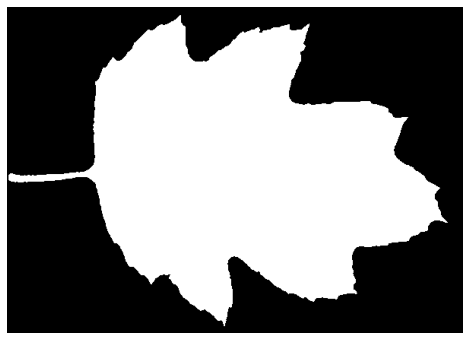

In [82]:
valor, mascara = cv2.threshold(desfoque, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
print(valor)
showImg(mascara)

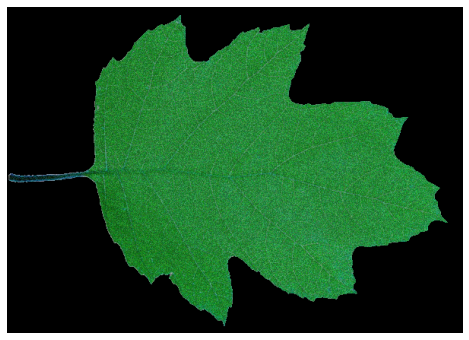

In [83]:
img_final = cv2.bitwise_and(img, img, mask=mascara)
showImg(img_final)

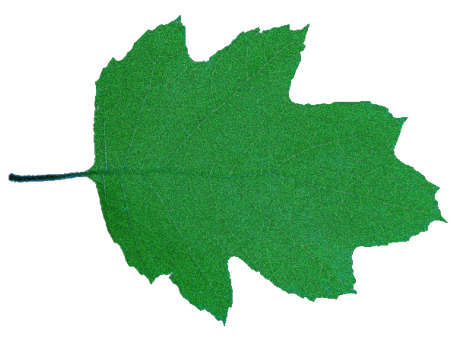

In [84]:
fundo_branco = 255 * np.ones((altura, largura, 3), dtype='uint8')
img_final = img.copy()
img_final[mascara == 0] = fundo_branco[mascara == 0]
showImg(img_final)

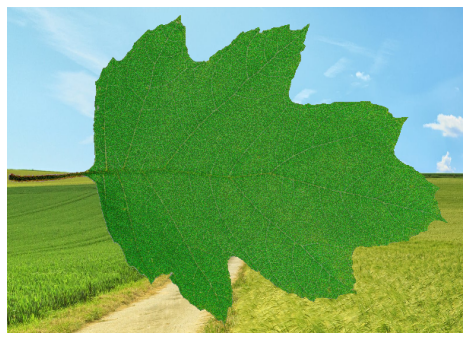

In [85]:
fundo = cv2.imread('./assets/imagens/paisagem03.jpg')
fundo = cv2.resize(fundo, (largura, altura))
img_final[mascara == 0] = fundo[mascara == 0]
showImg(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))

    Segmentação baseada em Região

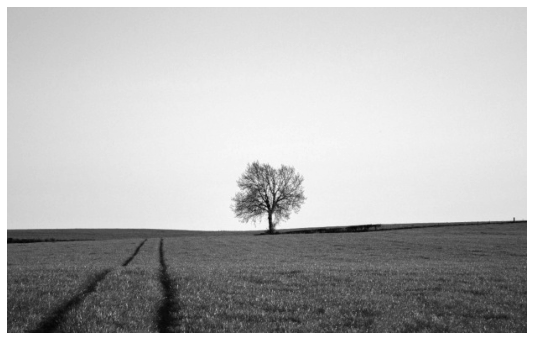

In [86]:
img = cv2.imread('./assets/imagens/paisagem01.jpg')
altura, largura = img.shape[0], img.shape[1]
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
showImg(gray)

In [87]:
img_flat = gray.reshape(altura * largura)
print(img_flat)
print(img_flat.shape)

[156 158 159 ...  66  60  62]
(241180,)


In [88]:
media = img_flat.mean()
media

152.5262874201841

In [89]:
num_pixels = len(img_flat)
num_pixels

241180

In [90]:
for i in range(num_pixels):
    if img_flat[i] > media:
        img_flat[i] = 255
    else:
        img_flat[i] = 0

In [91]:
img_flat

array([255, 255, 255, ...,   0,   0,   0], dtype=uint8)

In [92]:
seg_regiao = img_flat.reshape(altura, largura)
seg_regiao.shape

(389, 620)

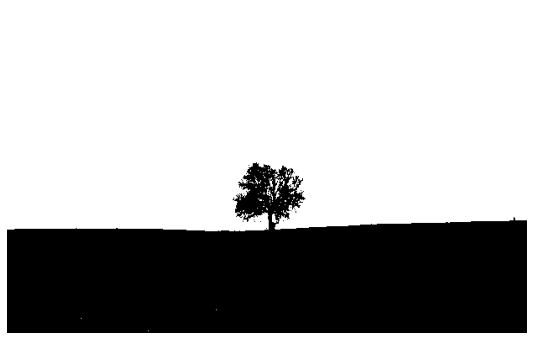

In [93]:
showImg(seg_regiao)

In [94]:
def flatten_img(img):
    altura, largura = img.shape[0], img.shape[1]
    img_flat = img.reshape(altura * largura)
    return img_flat

In [95]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_flat = flatten_img(gray)
print(img_flat)
print(img_flat.shape)
print(f'Média: {img_flat.mean() }')

[156 158 159 ...  66  60  62]
(241180,)
Média: 152.5262874201841


In [97]:
from skimage.color import rgb2gray

In [98]:
gray = rgb2gray(img)
img_flat = flatten_img(gray)
print(img_flat)
print(img_flat.shape)
print(f'Média: {img_flat.mean() }')

[0.6640902  0.67193333 0.6758549  ... 0.2539749  0.23211216 0.23995529]
(241180,)
Média: 0.6144771479539324


In [99]:
#2 Regioes
def segmenta2regioes(img):
    pixels = flatten_img(img).copy()
    media = pixels.mean()
    for i in range(len(pixels)):
        if pixels[i] > media:

            pixels[i] = 255
        else:
            pixels[i] = 0
            
        seg_regiao = pixels.reshape(img.shape[0], img.shape[1])
    return seg_regiao

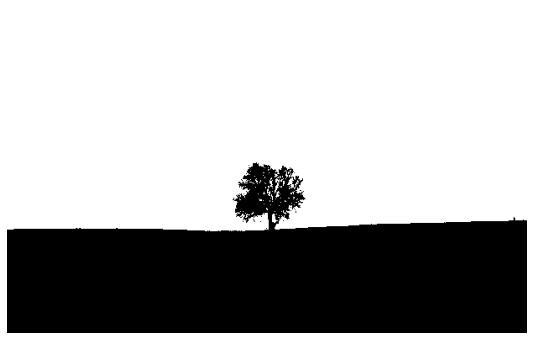

In [100]:
seg_regiao = segmenta2regioes(gray)
showImg(seg_regiao)

In [101]:
#3 Regioes
def segmenta3regioes(img):
    pixels = flatten_img(img).copy()
    for i in range(len(pixels)):
        if pixels[i] > 0.66:
            pixels[i] = 2
        elif pixels[i] > 0.33:
            pixels[i] = 1
        else:
            pixels[i] = 0

        seg_regiao = pixels.reshape(img.shape[0], img.shape[1])
    return seg_regiao 

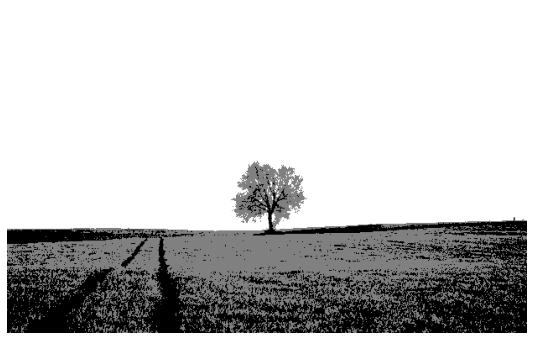

In [102]:
seg_regiao = segmenta3regioes(gray)
showImg(seg_regiao)

In [103]:
#4 Regioes
def segmenta4regioes(img):
    pixels = flatten_img(img).copy()
    for i in range(len(pixels)):
        if pixels[i] > 0.75:
            pixels[i] = 3
        elif pixels[i] > 0.5:
            pixels[i] = 2
        elif pixels[i] > 0.25:
            pixels[i] = 1
        else:
            pixels[i] = 0

        seg_regiao = pixels.reshape(img.shape[0], img.shape[1])
    return seg_regiao 

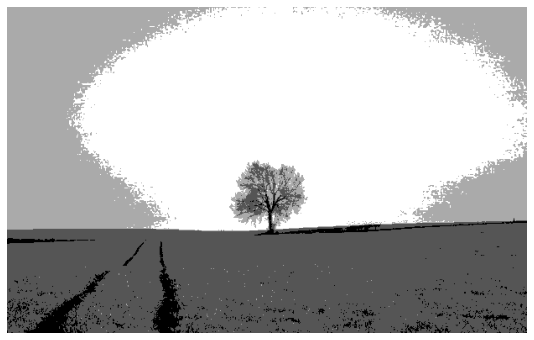

In [104]:
seg_regiao = segmenta4regioes(gray)
showImg(seg_regiao)

In [105]:
#5 Regioes
def segmenta5regioes(img):
    pixels = flatten_img(img).copy()
    for i in range(len(pixels)):
        if pixels[i] > 0.8:
            pixels[i] = 4
        elif pixels[i] > 0.6:
            pixels[i] = 3
        elif pixels[i] > 0.4:
            pixels[i] = 2
        elif pixels[i] > 0.2:
            pixels[i] = 1
        else:
            pixels[i] = 0

        seg_regiao = pixels.reshape(img.shape[0], img.shape[1])
    return seg_regiao 

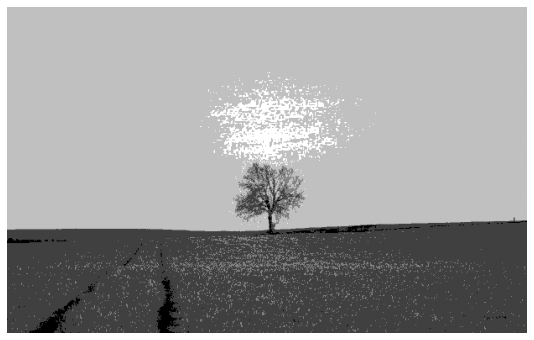

In [107]:
seg_regiao = segmenta5regioes(gray)
showImg(seg_regiao)

In [108]:
def segmentacao_regiao(img, cmap='gray'):
    original = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = rgb2gray(img)
    segment2R = segmenta2regioes(gray)
    segment3R = segmenta3regioes(gray)
    segment4R = segmenta4regioes(gray)
    segment5R = segmenta5regioes(gray)
    
    titulos = ['Original', '2 Regiões', '3 Regiões', '4 Regiões', '5 Regiões', 'Original Gray']
    imagens = [original, segment2R, segment3R, segment4R, segment5R, gray]
    
    fig = plt.gcf()
    fig.set_size_inches(18, 10)
    for i in range(6):
        plt.subplot(2,3,i+1)
        plt.imshow(imagens[i], cmap)
        plt.title(titulos[i])
        plt.xticks([]), plt.yticks([])
        
    plt.subplots_adjust(wspace=0.05)
    plt.show()

    

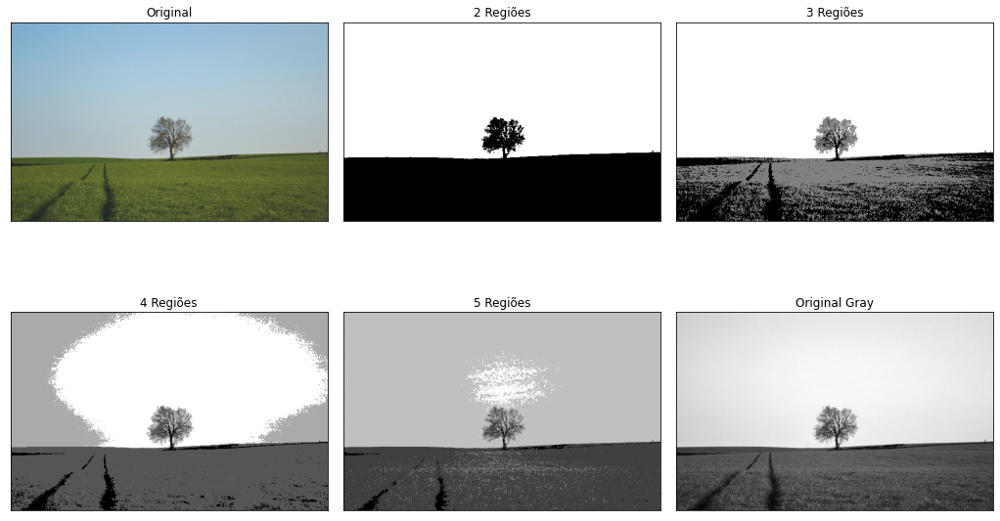

In [111]:
img = cv2.imread('./assets/imagens/paisagem01.jpg')
segmentacao_regiao(img)

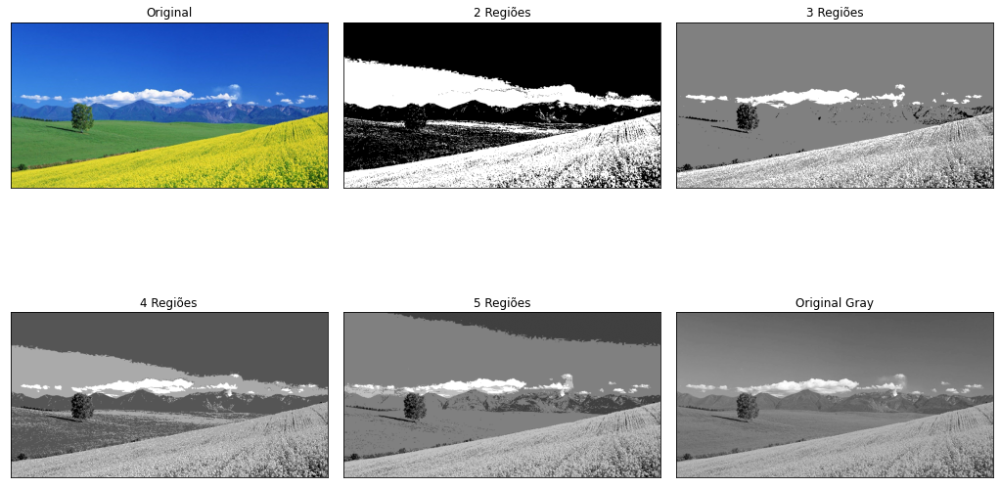

In [110]:
img = cv2.imread('./assets/imagens/paisagem02.jpg')
segmentacao_regiao(img)

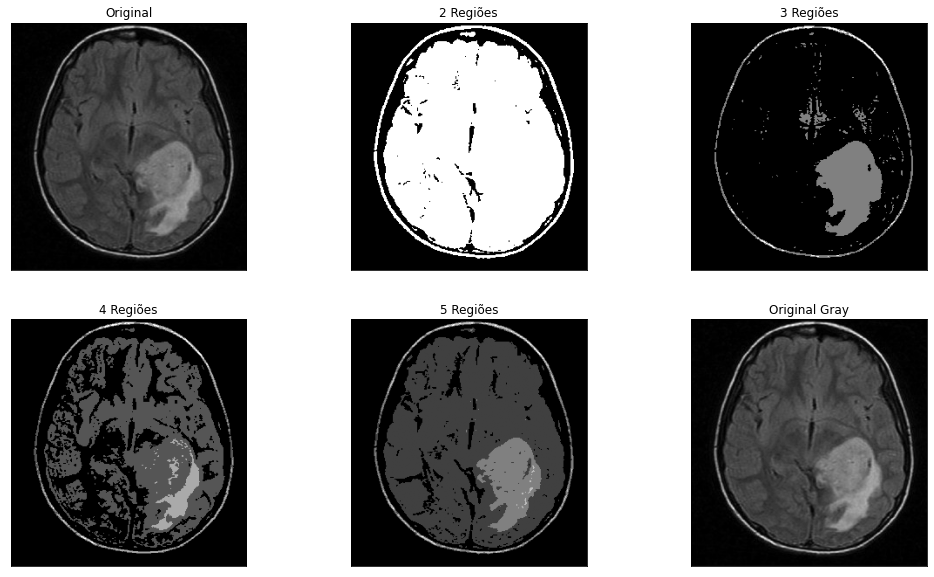

In [112]:
img = cv2.imread('./assets/imagens/ct-scan.jpg')
segmentacao_regiao(img)

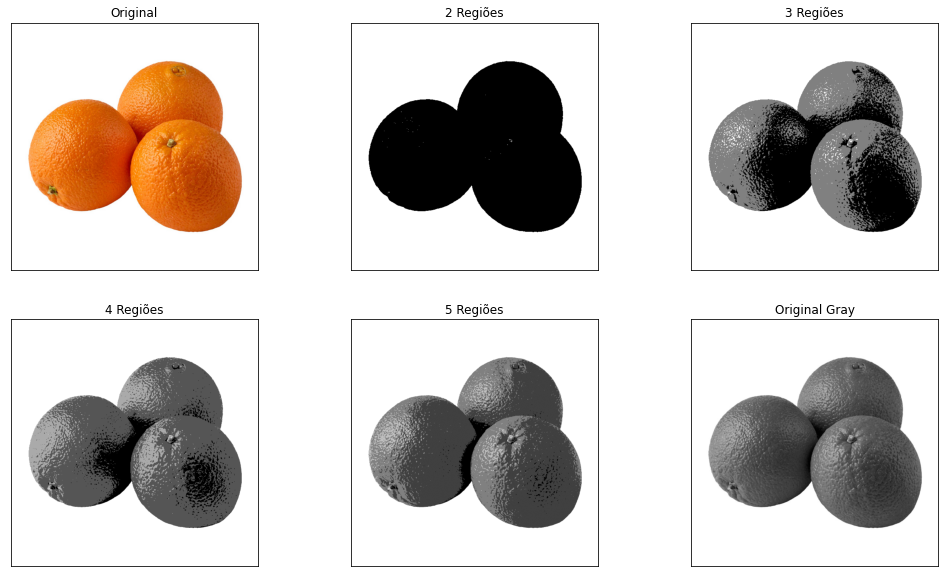

In [113]:
img = cv2.imread('./assets/imagens/laranjas.jpg')
segmentacao_regiao(img)

    Segmentacao baseada em cluster

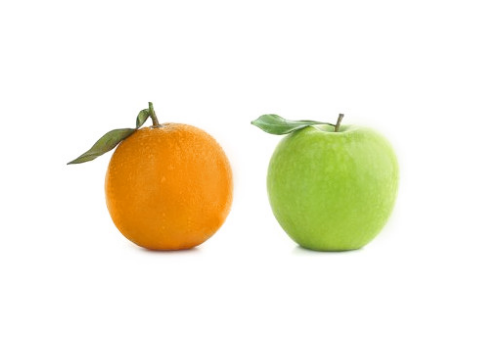

(334, 500, 3)

In [114]:
img = cv2.imread('./assets/imagens/frutas.jpg')
showImg(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
img.shape

In [115]:
#Conversão do shape
vetorizado = img.reshape((-1, 3))
vetorizado.shape

(167000, 3)

In [116]:
vetorizado = np.float32(vetorizado)

In [117]:
criterio = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0) #10 ITERACOES OU 1 PRECISAO

In [119]:
ret, label, centros = cv2.kmeans(vetorizado, 3, None, criterio, 10, cv2.KMEANS_RANDOM_CENTERS)

In [121]:
ret

66691163.58572686

In [123]:
print(label), print(len(label)), np.unique(label)

[[2]
 [2]
 [2]
 ...
 [2]
 [2]
 [2]]
167000


(None, None, array([0, 1, 2], dtype=int32))

In [124]:
centros

array([[ 14.406983, 133.79312 , 225.93048 ],
       [ 84.77781 , 190.10513 , 166.05893 ],
       [254.4694  , 255.06332 , 255.06282 ]], dtype=float32)

In [125]:
centros = np.uint8(centros)
centros

array([[ 14, 133, 225],
       [ 84, 190, 166],
       [254, 255, 255]], dtype=uint8)

In [127]:
img_final = centros[label.flatten()]
print(img_final)

[[254 255 255]
 [254 255 255]
 [254 255 255]
 ...
 [254 255 255]
 [254 255 255]
 [254 255 255]]


In [128]:
img_final = img_final.reshape(img.shape)
img_final.shape

(334, 500, 3)

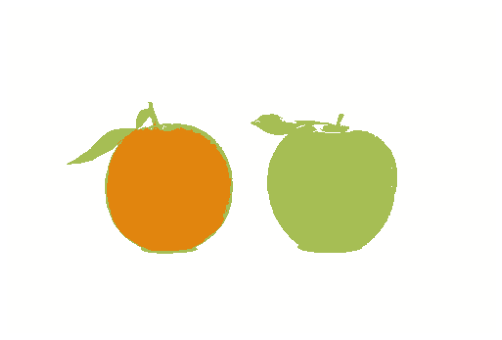

In [131]:
showImg(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))

In [139]:
def segmentacao_cluster(img, k):
    vetorizado = np.float32(img).reshape(-1,3)
    criterio = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 20, 1.0) 
    ret, label, centros = cv2.kmeans(vetorizado, k, None, criterio, 10, cv2.KMEANS_RANDOM_CENTERS)
    centros = np.uint8(centros)
    img_final = centros[label.flatten()]
    img_final = img_final.reshape(img.shape)
    
    return img_final
    
    

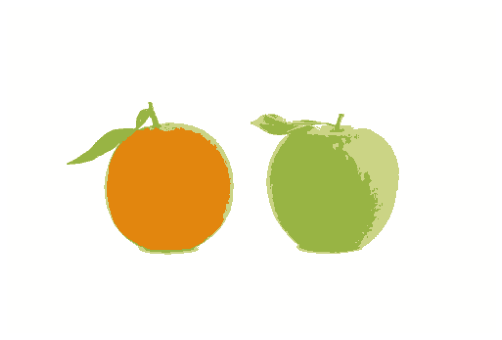

In [146]:
img = cv2.imread('./assets/imagens/frutas.jpg')
seg_cluster = segmentacao_cluster(img, 4)
showImg(seg_cluster)

In [153]:
def segmentacao_clustering(img):
    titulos = ['Original']
    imagens = [img]
    
    segmentacoes = 6
    for k in range(2, segmentacoes + 1):
        titulo = f'k = {k}'
        titulos.append(titulo)
        seg = segmentacao_cluster(img, k)
        imagens.append(seg)
        
    fig = plt.gcf()
    fig.set_size_inches(18, 10)
    for i in range(6):
        plt.subplot(2,3,i+1)
        plt.imshow(cv2.cvtColor(imagens[i], cv2.COLOR_BGR2RGB))
        plt.title(titulos[i])
        plt.xticks([]), plt.yticks([])
        
    plt.subplots_adjust(wspace=0.05)
    plt.show()
        

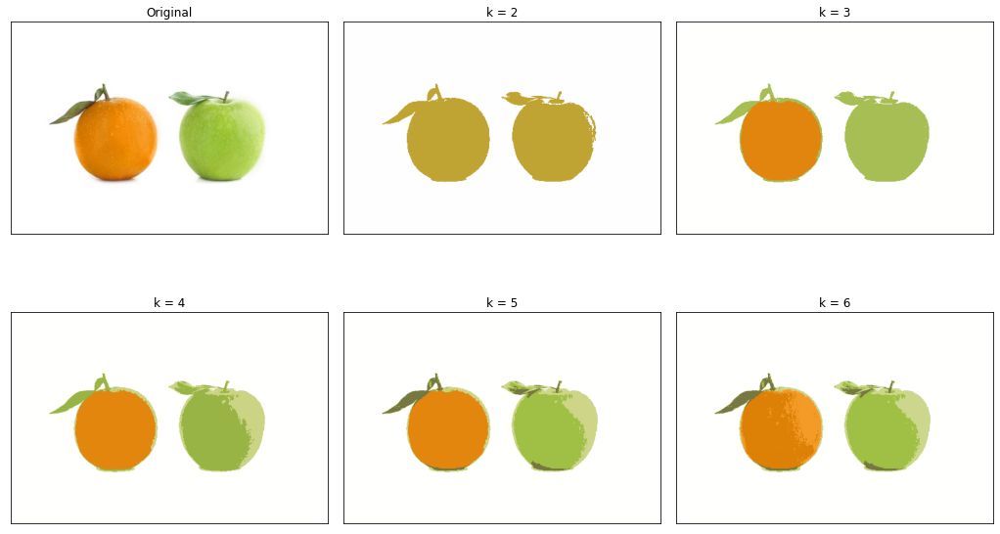

In [154]:
segmentacao_clustering(img)

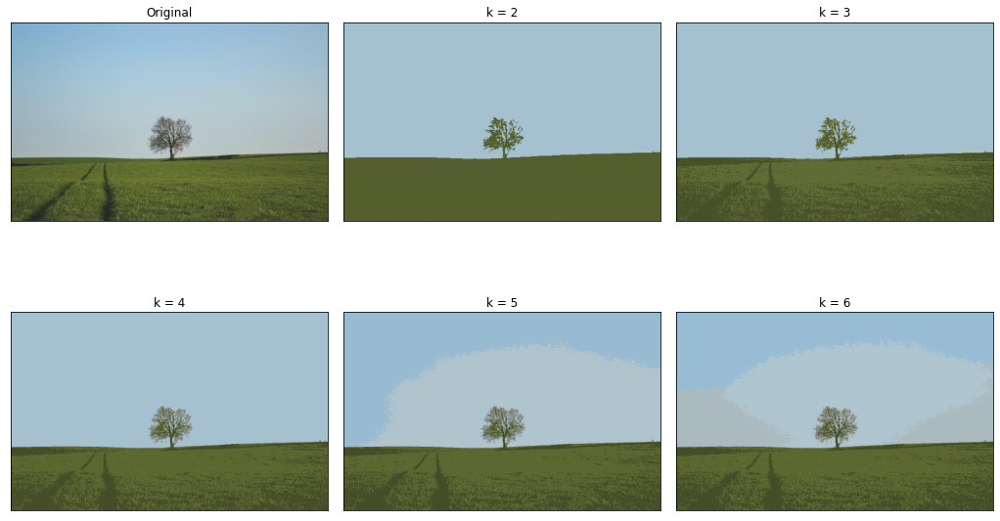

In [155]:
img = cv2.imread('./assets/imagens/paisagem01.jpg')
segmentacao_clustering(img)

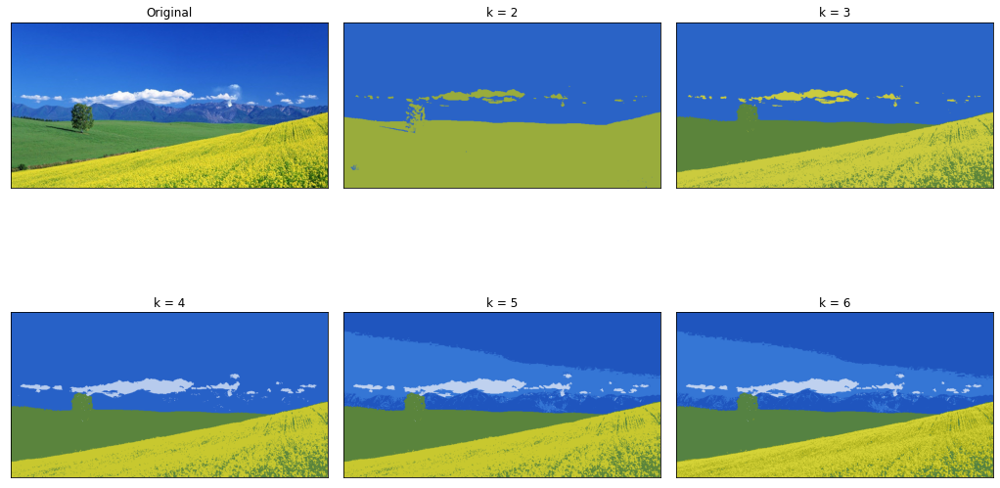

In [156]:
img = cv2.imread('./assets/imagens/paisagem02.jpg')
segmentacao_clustering(img)

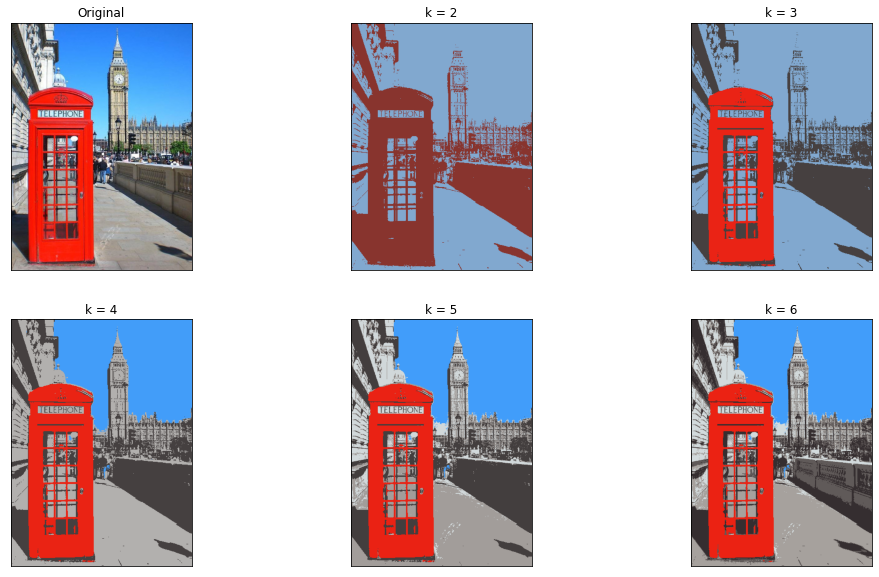

In [157]:
img = cv2.imread('./assets/imagens/london-red-phonebox.jpg')
segmentacao_clustering(img)

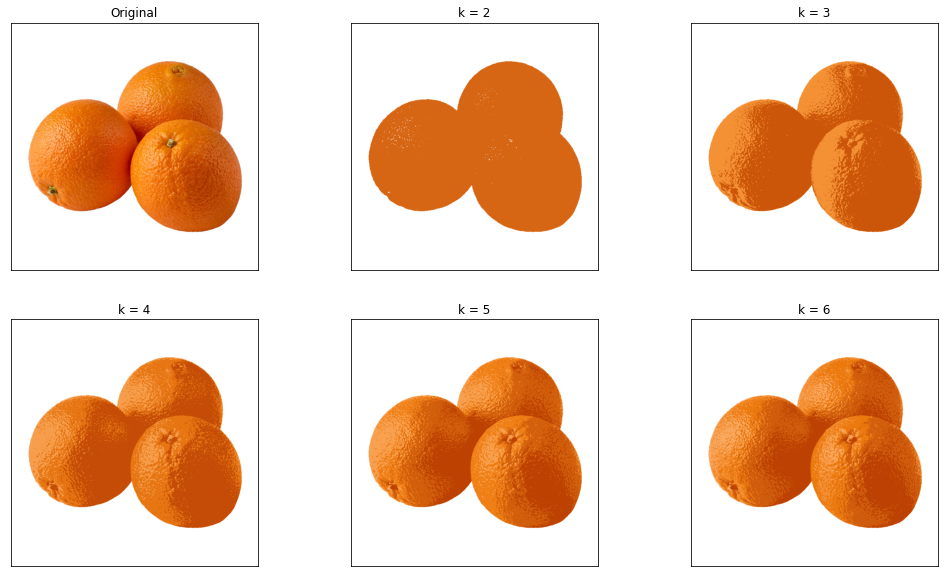

In [158]:
img = cv2.imread('./assets/imagens/laranjas.jpg')
segmentacao_clustering(img)

    Watershed
   

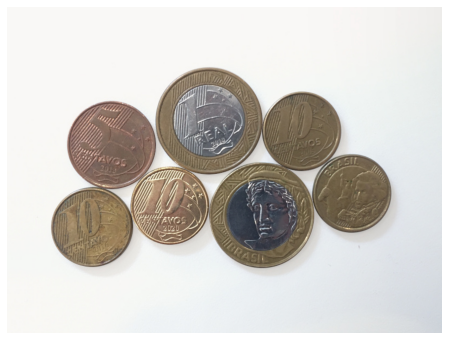

In [159]:
img = cv2.imread('./assets/imagens/moedas03.jpg')
showImg(img)

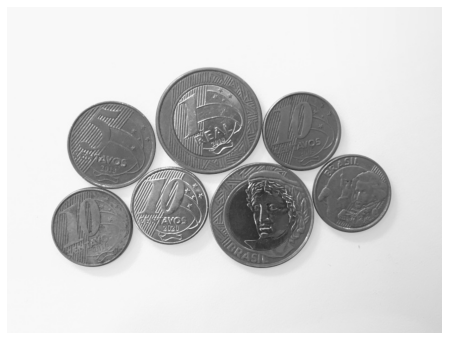

In [160]:
#Limiarizacao
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
showImg(gray)

174.0


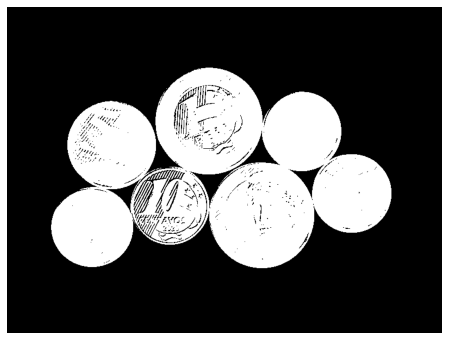

In [162]:
val, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
print(val)
showImg(thresh)

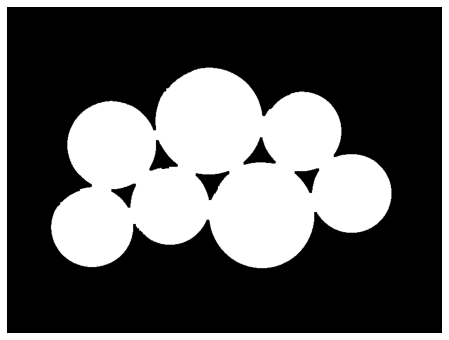

In [163]:
#Operacoes morfologicas para tirar detalhes

dilatacao = cv2.dilate(thresh, np.ones((3,3), np.uint8), iterations = 2)
seg = cv2.erode(dilatacao, np.ones((3,3), np.uint8), iterations = 2)
showImg(seg)

In [ ]:
#Como as imagens estão conectadas outros algoritmos identificariam
# essa imagem como uma mesma imagem

In [164]:
from scipy import ndimage as ndi
from skimage.feature import peak_local_max
from skimage.segmentation import watershed

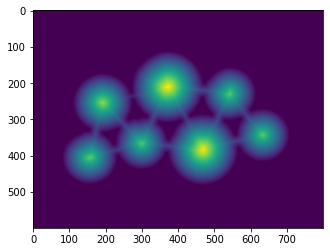

In [167]:
#Calculo da distancia euclidiana para geracao de map de distancias
dist = ndi.distance_transform_edt(seg)
plt.imshow(dist);

In [171]:
#Busca maximo local, picos
local_max = peak_local_max(dist, indices = False, min_distance=20, labels=seg) #indices determina o tipo de matriz de saida falso => matriz boolean
print(local_max)

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


/tmp/ipykernel_5222/474335565.py:2: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(dist, indices = False, min_distance=20, labels=seg) #indices determina o tipo de matriz de saida falso => matriz boolean


In [172]:
markers = ndi.label(local_max, structure=np.ones((3, 3)))[0]

In [177]:
markers, np.unique(markers, return_counts=True)

(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int32),
 (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32),
  array([479993,      1,      1,      1,      1,      1,      1,      1])))

In [186]:
labels = watershed(-dist, markers, mask=seg)

In [187]:
np.unique(labels)

array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32)

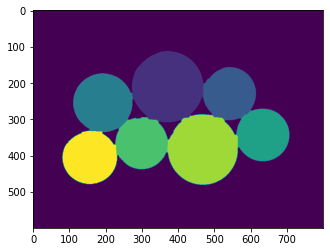

In [188]:
plt.imshow(labels);

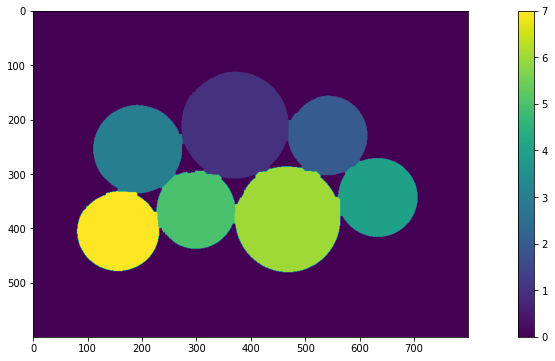

In [191]:
fig = plt.gcf()
fig.set_size_inches(18,6)
plot = plt.imshow(labels)
plt.colorbar(plot);

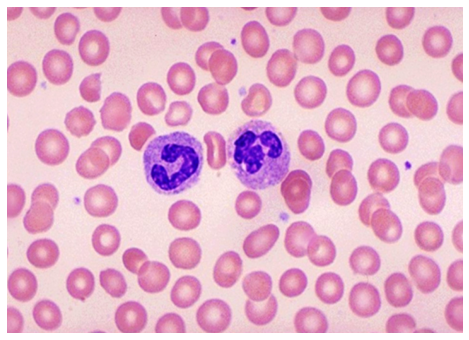

In [192]:
img = cv2.imread('./assets/imagens/rbc.jpg')
showImg(img)

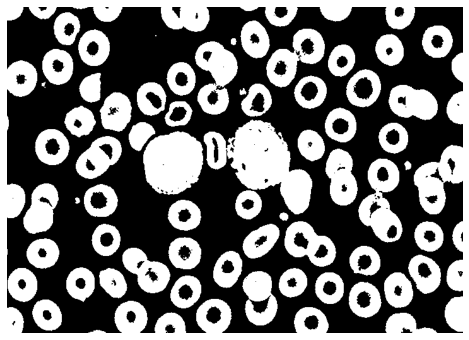

In [195]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
showImg(thresh)

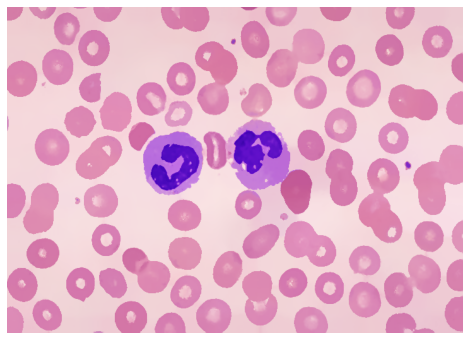

In [196]:
#Como os 'buracos' são grandes sera utilizado outro filtro
filtro = cv2.pyrMeanShiftFiltering(img, 20, 40)
showImg(filtro)

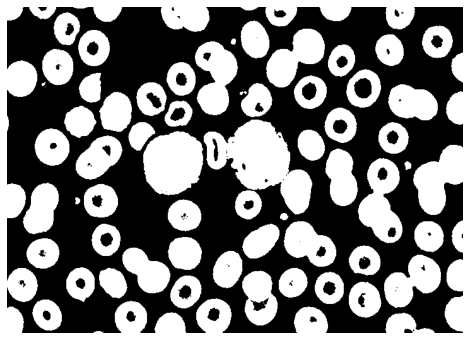

In [197]:
gray = cv2.cvtColor(filtro, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
showImg(thresh)

In [198]:
#deteccao de contornos
def preenche_buracos(img_thresh, limiar=1000):
    # 1 detectar contornos
    # 2 verificar contornos abaixo do limiar
    # 3 add contornos abaixo do limiar em lista
    # 4 preencher contornos pequenos
    
    #1
    contornos, _ = cv2.findContours(img_thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    buracos = []
    for con in contornos:
        area = cv2.contourArea(con)
        if area < limiar: #2
            buracos.append(con) #3
            
    cv2.drawContours(img_thresh, buracos, -1, 255, -1) #segundo -1 é para preencher o controno
    
    return img_thresh
    

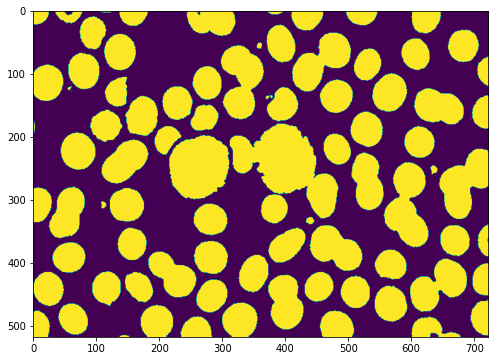

In [200]:
seg = preenche_buracos(thresh)

fig = plt.gcf()
fig.set_size_inches(18, 6)
plt.imshow(seg);

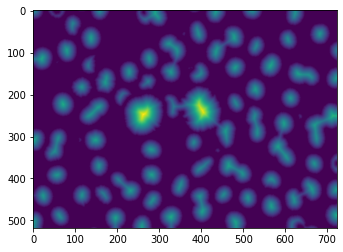

In [201]:
dist = ndi.distance_transform_edt(seg)
plt.imshow(dist);

In [203]:
local_max = peak_local_max(dist, indices = False, min_distance=20, labels=seg);


/tmp/ipykernel_5222/1503757353.py:1: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(dist, indices = False, min_distance=20, labels=seg);


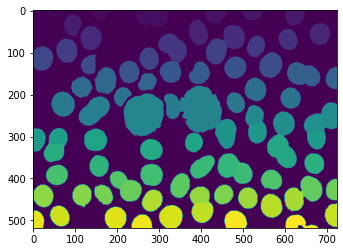

In [205]:
markers = ndi.label(local_max, structure=np.ones((3, 3)))[0]
labels = watershed(-dist, markers, mask=seg)
plt.imshow(labels);


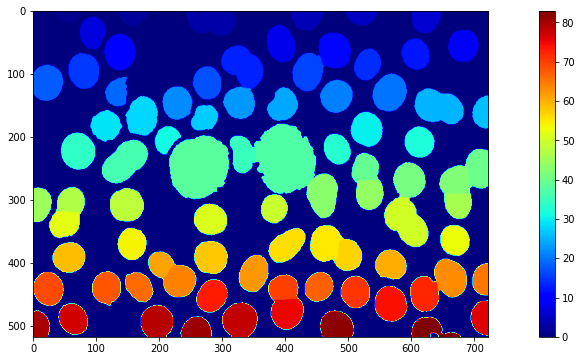

In [208]:
fig = plt.gcf()
fig.set_size_inches(18,6)
plot = plt.imshow(labels, cmap='jet')
plt.colorbar(plot);

In [216]:
def segmentacao_watershed(img, preenchimento = 1000):
    original = gray = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    filtro = cv2.pyrMeanShiftFiltering(img, 20, 40)
    gray = cv2.cvtColor(filtro, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
    
    if preenchimento > 0:
        thresh = preenche_buracos(thresh, preenchimento)
        
    dist = ndi.distance_transform_edt(thresh)
    local_max = peak_local_max(dist, indices = False, min_distance=20, labels=thresh)
    markers = ndi.label(local_max, structure=np.ones((3,3)))[0]
    labels = watershed(-dist, markers, mask=thresh)
    
    titulos = ['Original', 'Limiarização', 'Distance Transform', 'Watershed']
    imagens = [original, thresh, dist, labels]
    
    fig = plt.gcf()
    fig.set_size_inches(16, 12)
    for i in range(4):
        plt.subplot(2,2,i+1)
        
        if(i == 3):
            cmap = "jet"
        else:
            cmap = "gray"
            
        plt.imshow(imagens[i], cmap)
        plt.title(titulos[i])
        plt.xticks([]), plt.yticks([])
        
    plt.show()
    
    return labels
    
    
    

/tmp/ipykernel_5222/3561852653.py:11: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(dist, indices = False, min_distance=20, labels=thresh)


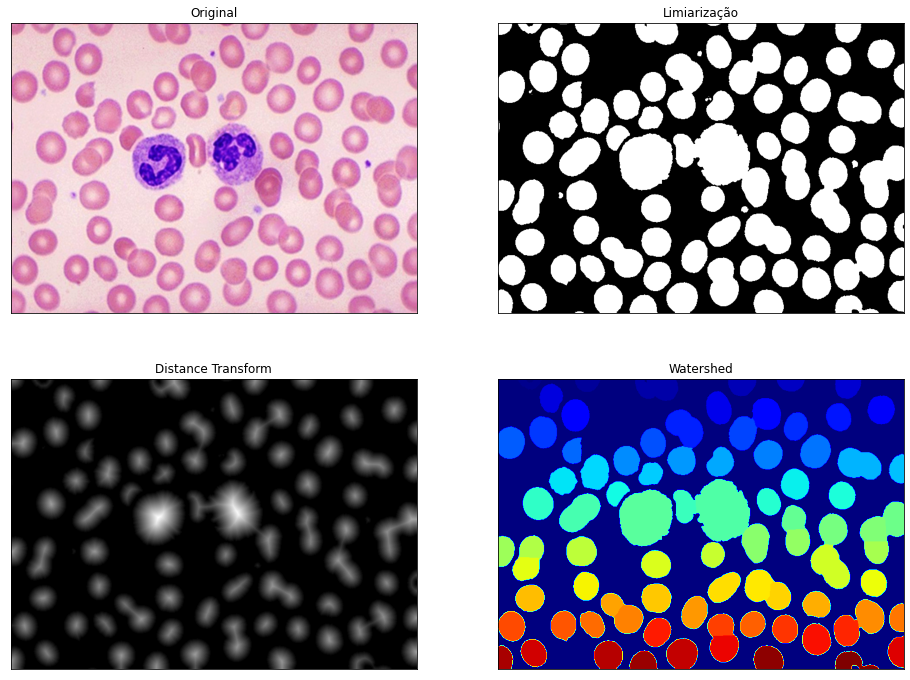

In [217]:
img = cv2.imread('./assets/imagens/rbc.jpg')
segmentacao = segmentacao_watershed(img)

/tmp/ipykernel_5222/3561852653.py:11: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(dist, indices = False, min_distance=20, labels=thresh)


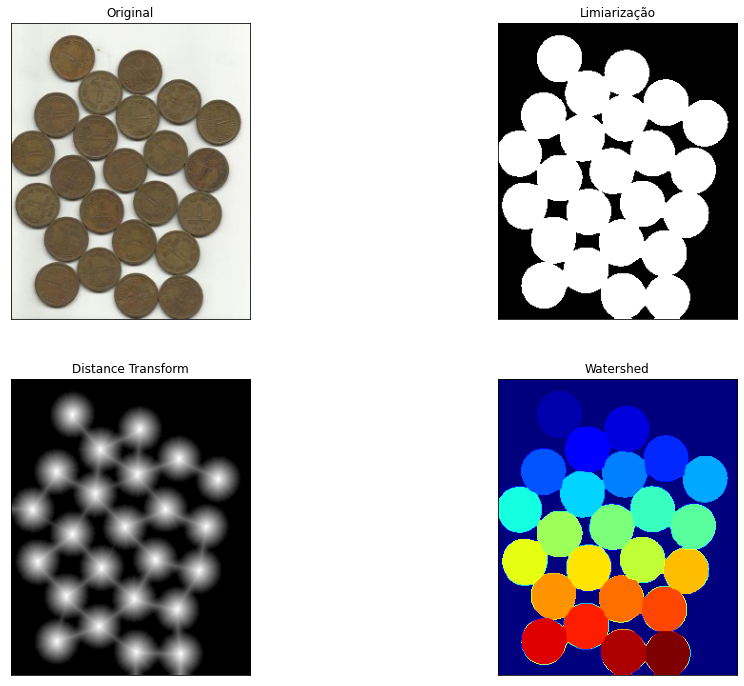

In [219]:
img = cv2.imread('./assets/imagens/moedas04.jpg')
segmentacao = segmentacao_watershed(img, 0)